In [1]:
import pandas as pd

In [2]:
# read pickle file
df_enem = pd.read_pickle('D:\Armazenamento\MBA\TCC\Bases\microdados_enem_2023\DADOS\MICRODADOS_ENEM_2023_tratados.pkl')

In [3]:
df_enem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 721048 entries, 0 to 721047
Data columns (total 45 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   BIN_Q001_DUMMY_H         721048 non-null  bool    
 1   BIN_Q002_DUMMY_H         721048 non-null  bool    
 2   BIN_Q018                 721048 non-null  bool    
 3   BIN_Q020                 721048 non-null  bool    
 4   BIN_Q021                 721048 non-null  bool    
 5   BIN_Q023                 721048 non-null  bool    
 6   BIN_Q025                 721048 non-null  bool    
 7   CAT_COR_RACA             721048 non-null  category
 8   CAT_CO_MUNICIPIO_ESC     721048 non-null  category
 9   CAT_CO_UF_ESC            721048 non-null  category
 10  CAT_DEPENDENCIA_ADM_ESC  721048 non-null  category
 11  CAT_ENSINO               721048 non-null  category
 12  CAT_ESCOLA               721048 non-null  category
 13  CAT_ESTADO_CIVIL         721048 non-null  ca

In [4]:
# Separarar variáveis por tipo
df_enem_num = df_enem.select_dtypes(include=['int64', 'float64'])
df_enem_bin = df_enem.select_dtypes(include=['bool'])
df_enem_cat = df_enem.select_dtypes(include=['category'])

In [5]:
print(len(df_enem_num.columns.to_list()))
print(len(df_enem_bin.columns.to_list()))
print(len(df_enem_cat.columns.to_list()))

23
7
15


## Analise variáveis numéricas

In [6]:
df_enem_num.describe()

,NUM_NOTA_CH,NUM_NOTA_CN,NUM_NOTA_LC,NUM_NOTA_MT,NUM_NOTA_REDACAO,NUM_Q001,NUM_Q002,NUM_Q005,NUM_Q006,NUM_Q007,...,NUM_Q011,NUM_Q012,NUM_Q013,NUM_Q014,NUM_Q015,NUM_Q016,NUM_Q017,NUM_Q019,NUM_Q022,NUM_Q024
count,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,...,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000,721048.000000
mean,526.981834,498.209624,522.074882,547.334344,643.322553,3.557114,3.927858,3.843678,4.412393,0.198628,...,0.293398,1.072931,0.593587,0.729770,0.167193,0.589056,0.051364,1.551769,3.020022,0.870656
std,86.610888,87.291123,74.453148,132.805877,216.664331,1.489913,1.428584,1.240765,3.997395,0.637649,...,0.543376,0.347058,0.631259,0.487371,0.381659,0.520320,0.227747,1.067274,1.446980,1.080488
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,472.100000,441.500000,475.800000,441.700000,520.000000,3.000000,3.000000,3.000000,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000
50%,534.800000,497.200000,528.200000,542.200000,660.000000,4.000000,4.000000,4.000000,3.000000,0.000000,...,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,3.000000,1.000000
75%,588.500000,555.100000,574.600000,647.700000,820.000000,4.000000,5.000000,4.000000,6.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,5.000000,1.000000
max,823.000000,868.400000,820.800000,958.600000,1000.000000,6.000000,6.000000,20.000000,16.000000,3.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


#### 1. Observar assimetrias, outliers, normalidade

- 'Q008', # Quantidade de banheiro (código A a E)
- 'Q009', # Quantidade de quartos (código A a E)
- 'Q010', # Quantidade de carros (código A a E)
- 'Q011', # Quantidade de motos (código A a E)
- 'Q012', # Quantidade de geladeira (código A a E)
- 'Q013', # Quantidade de freezer (código A a E)
- 'Q014', # Quantidade de máquina de lavar roupa (código A a E)
- 'Q015', # Quantidade de máquina de secar roupa (código A a E)
- 'Q016', # Quantidade de microondas (código A a E)
- 'Q017', # Quantidade de máquina de lavar louça (código A a E)
- 'Q019', # Quantidade de televisores (código A a E)
- 'Q022', # Quantidade de celulares (código A a E)
- 'Q024', # Quantidade de computadores (código A a E)

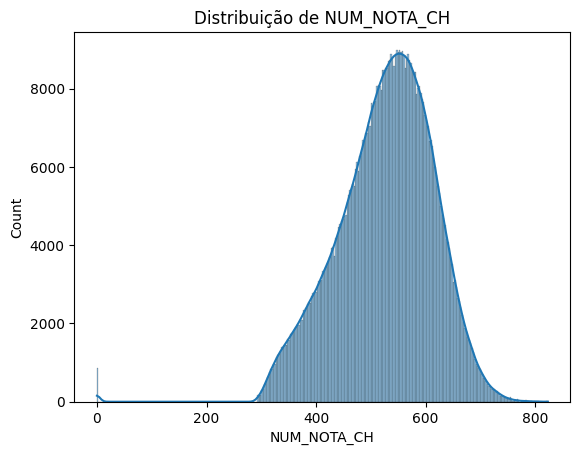

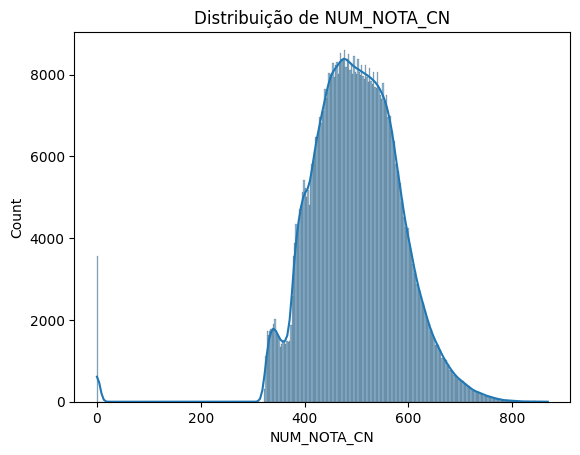

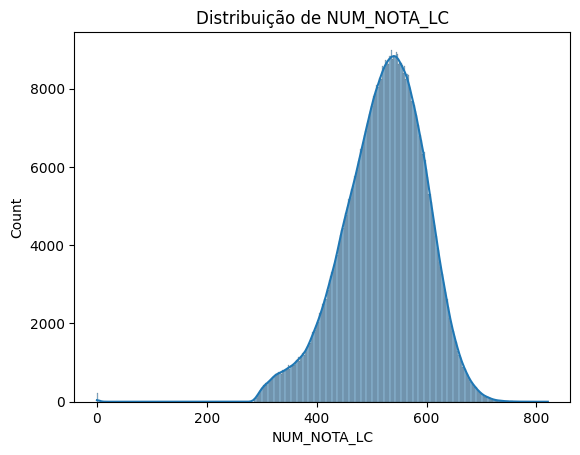

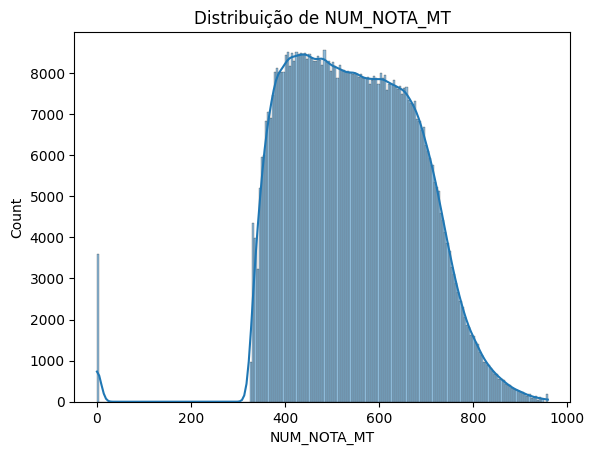

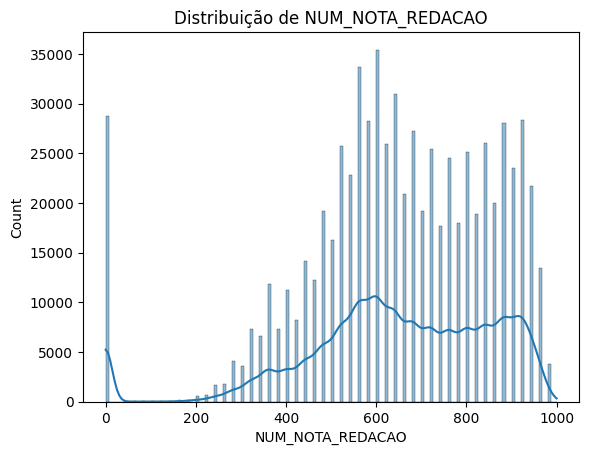

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in ['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']:
    sns.histplot(df_enem[col], kde=True)
    plt.title(f'Distribuição de {col}')
    plt.show()

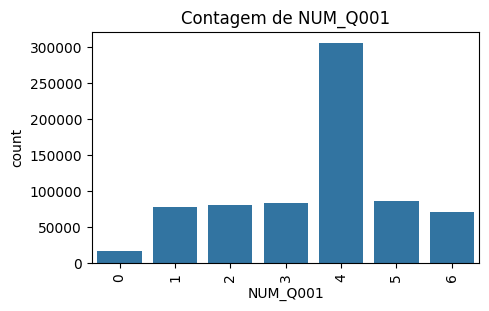

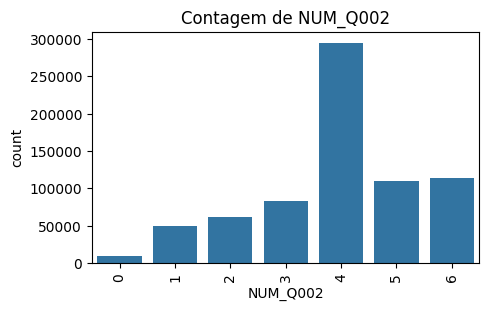

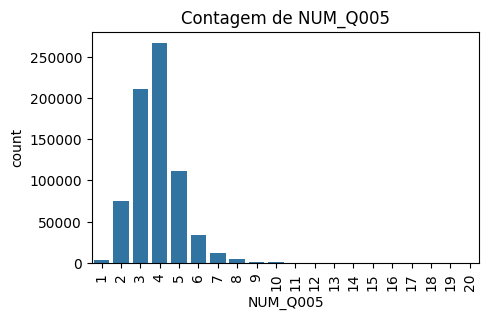

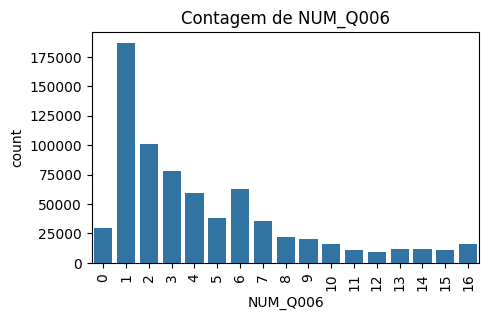

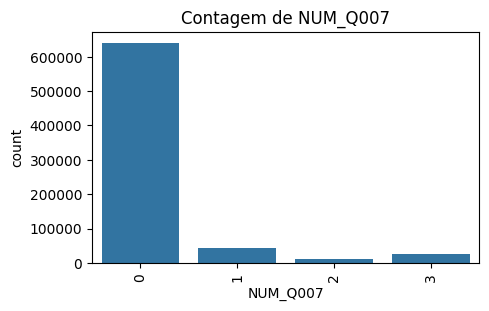

...

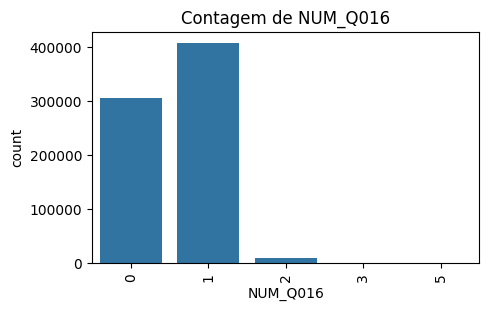

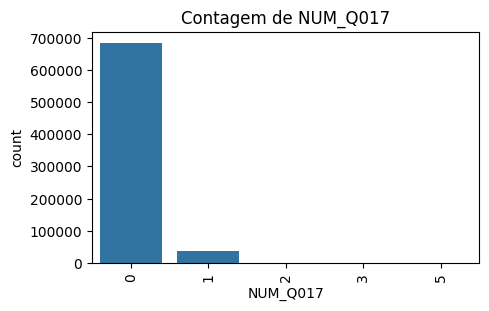

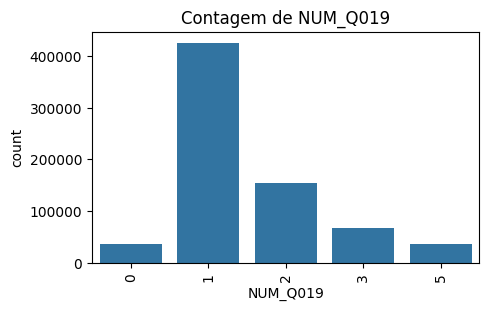

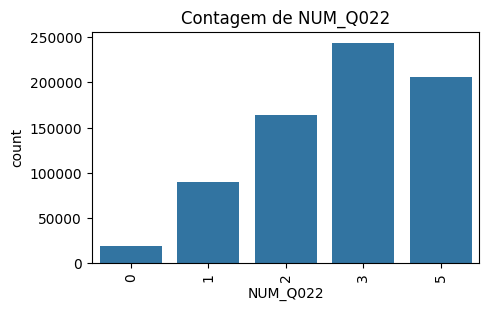

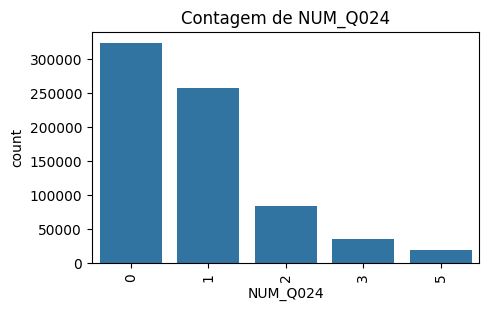

In [8]:
# grafico de barras para variáveis numéricas com categorias

for col in df_enem_num.drop(columns=['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']).columns.to_list():
    plt.figure(figsize=(5, 3))
    sns.countplot(data=df_enem, x=col)
    plt.title(f'Contagem de {col}')
    plt.xticks(rotation=90)
    plt.show()

#### 2. Foco em outliers

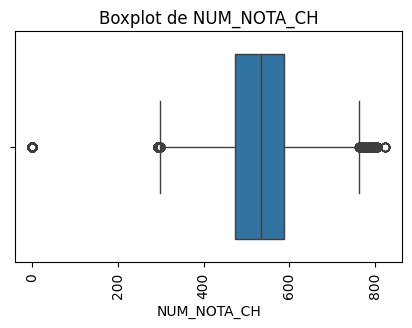

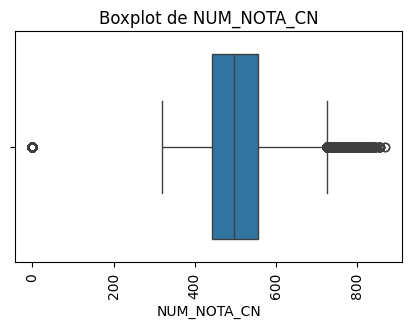

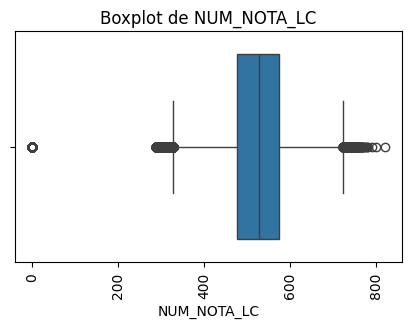

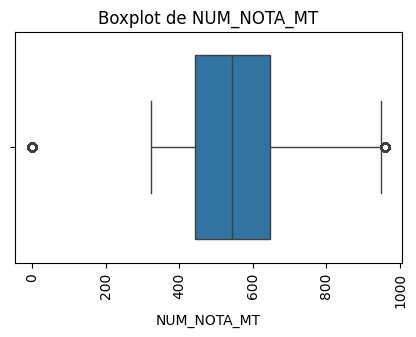

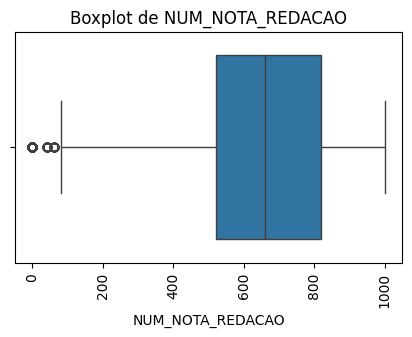

In [9]:
# boxplot para variáveis numéricas
for col in ['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']:
    plt.figure(figsize=(5, 3))
    sns.boxplot(data=df_enem, x=col)
    plt.title(f'Boxplot de {col}')
    plt.xticks(rotation=90)
    plt.show()

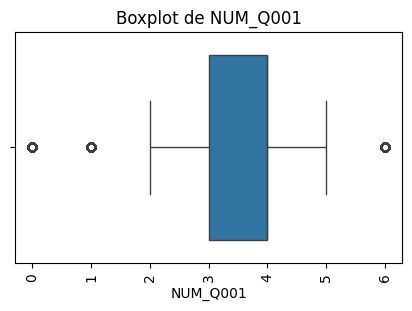

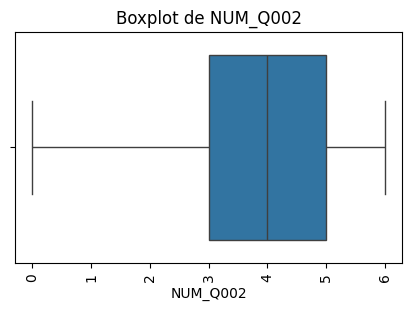

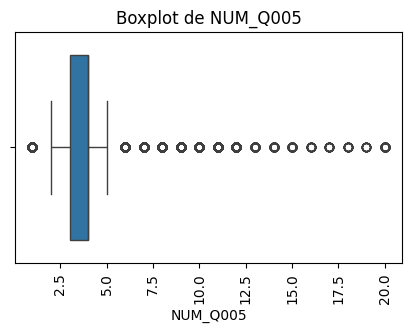

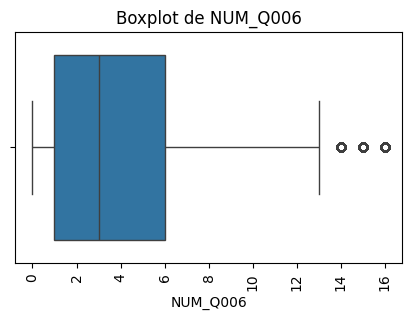

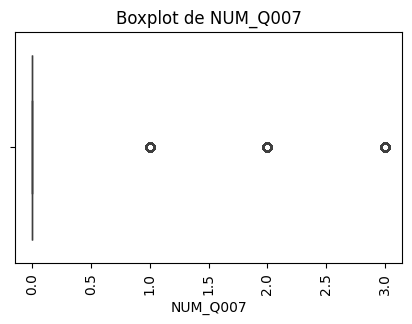

...

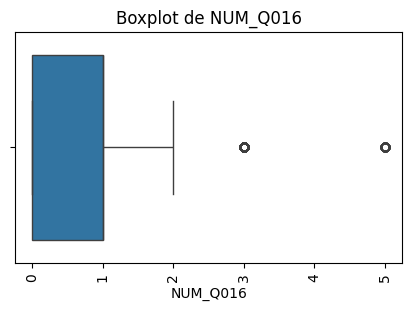

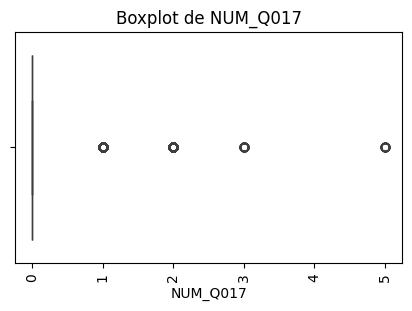

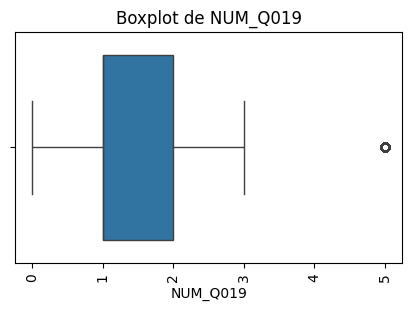

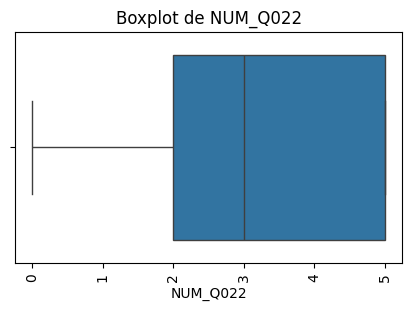

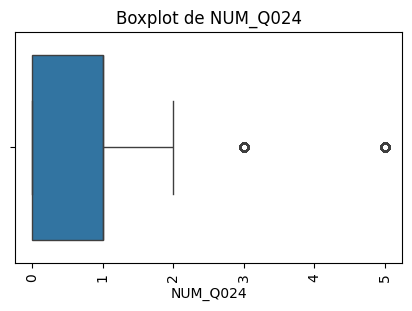

In [10]:
# boxplot para variáveis numéricas
for col in df_enem_num.drop(columns=['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']).columns.to_list():
    plt.figure(figsize=(5, 3))
    sns.boxplot(data=df_enem, x=col)
    plt.title(f'Boxplot de {col}')
    plt.xticks(rotation=90)
    plt.show()

#### 3. Analise de correlações

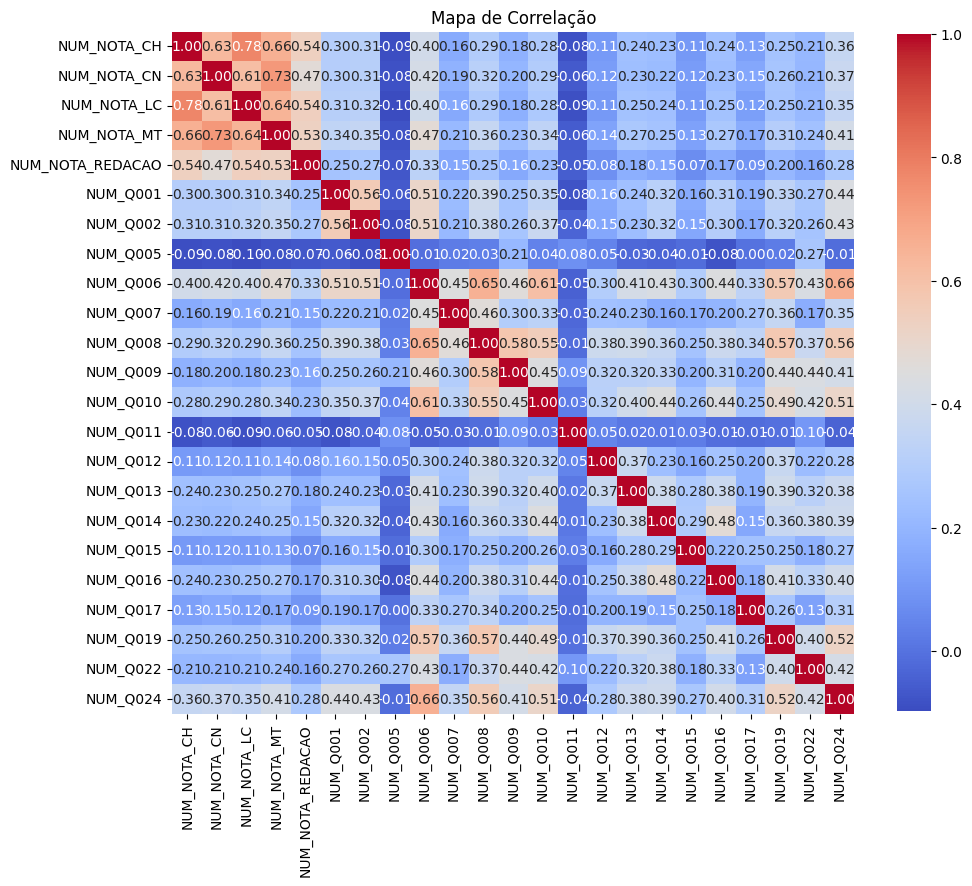

In [11]:
# mapa de correlação
plt.figure(figsize=(11, 11))
sns.heatmap(df_enem_num.corr(), annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Mapa de Correlação')
plt.show()

#### 4. Relação com a variável alvo

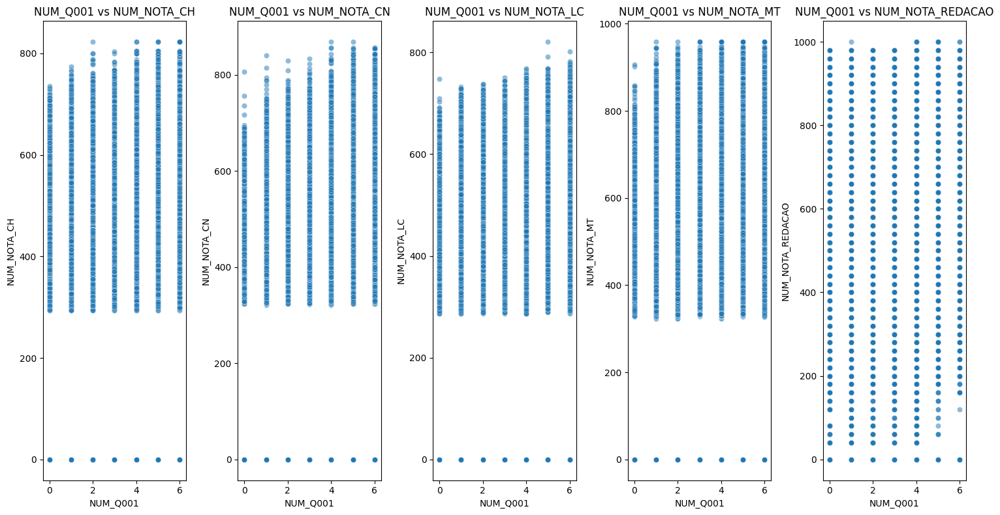

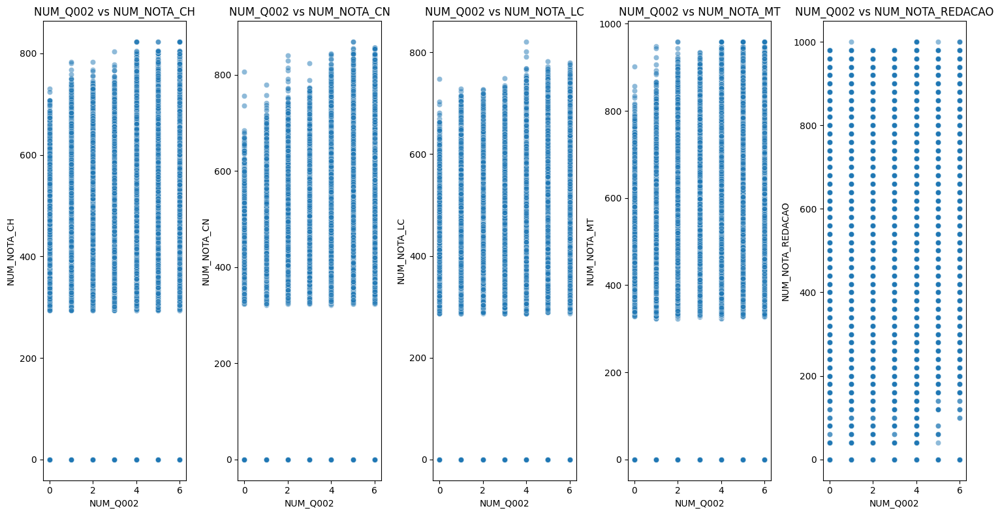

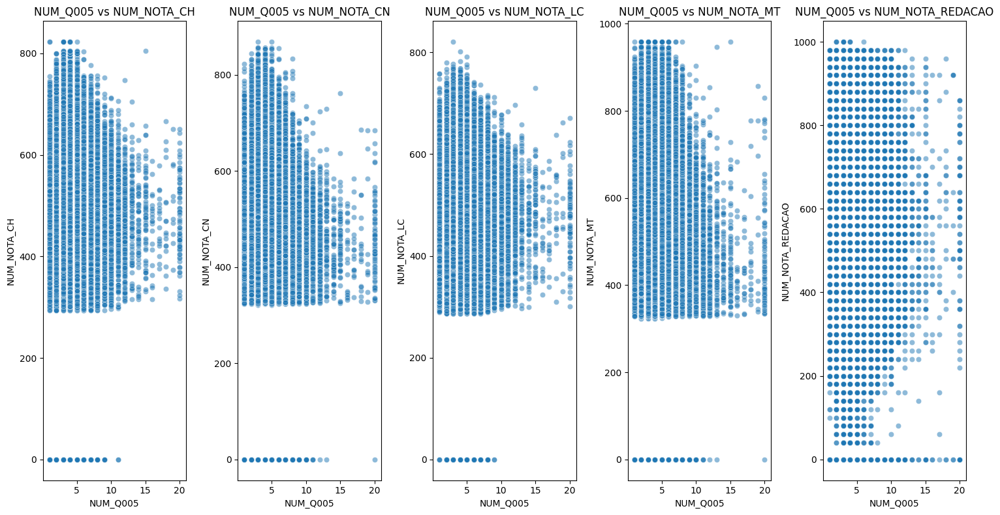

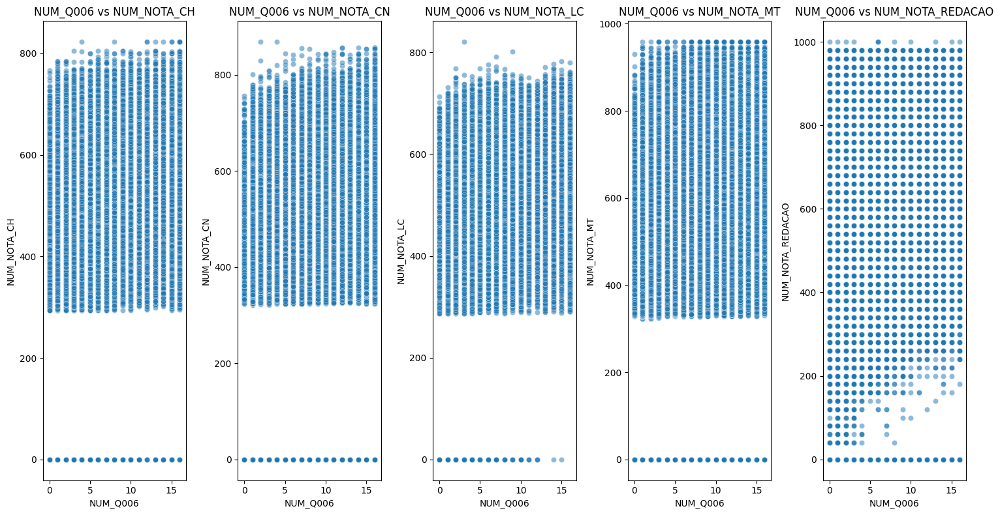

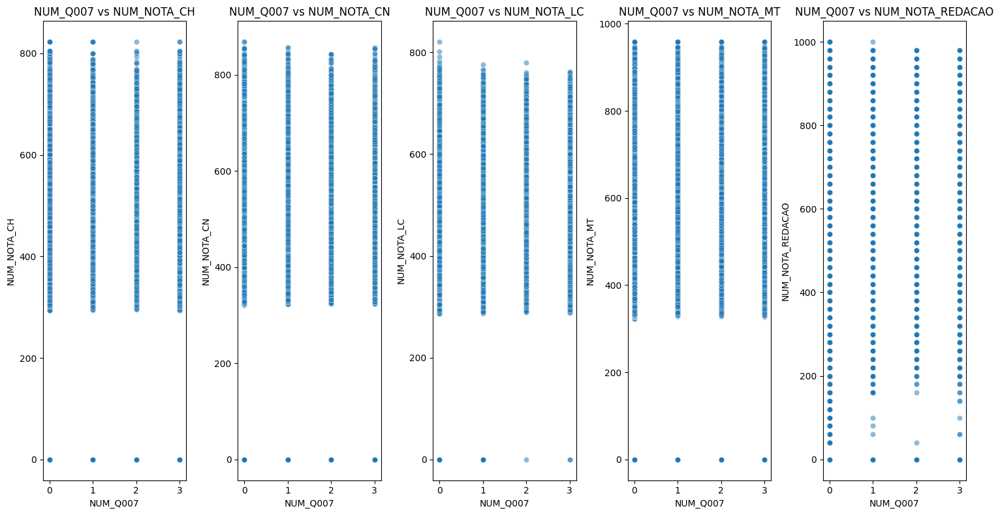

...

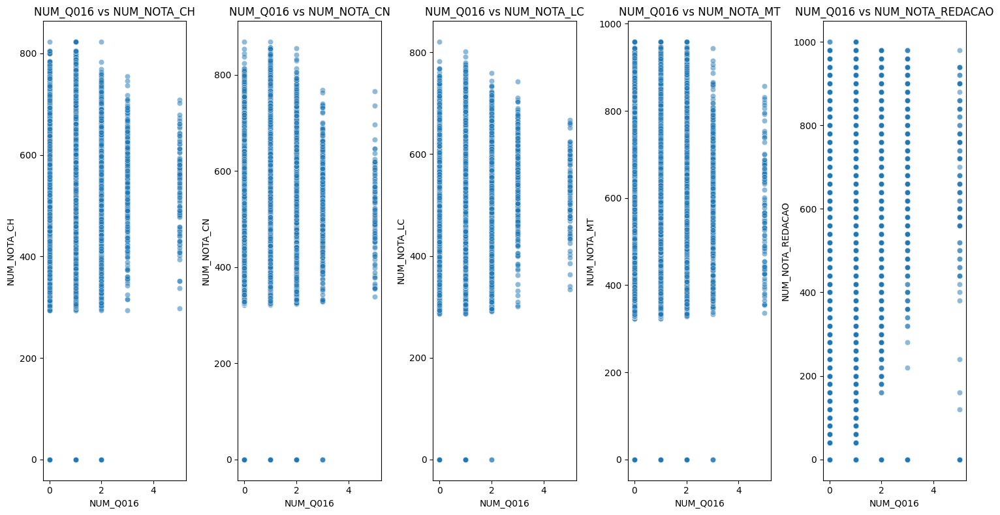

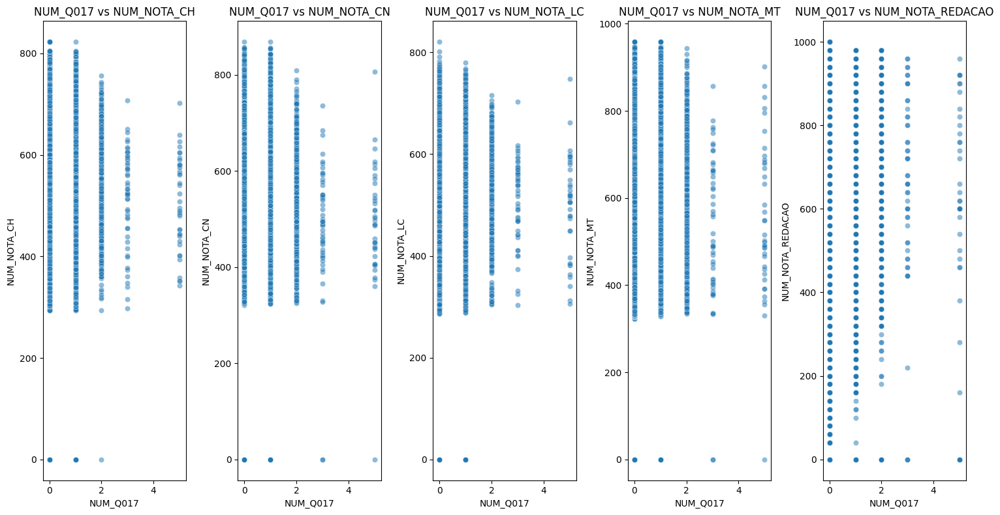

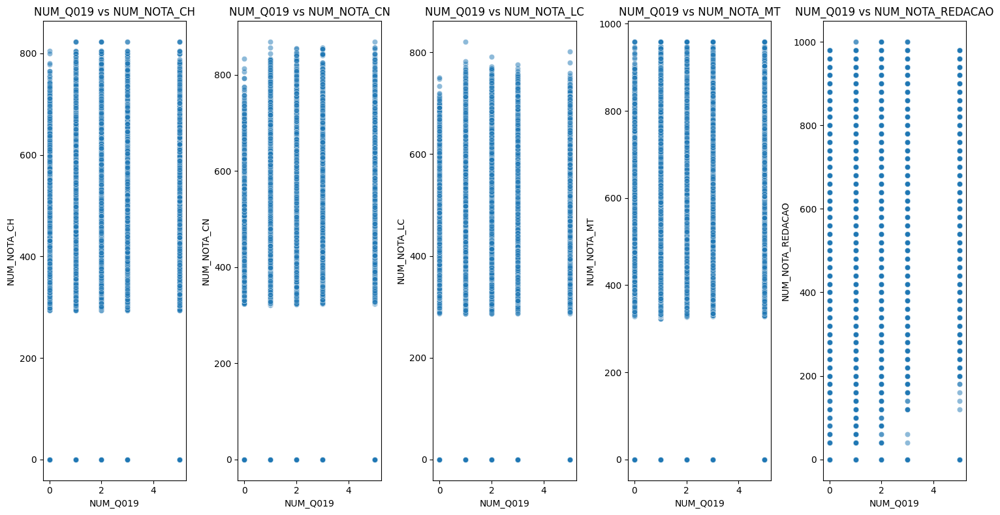

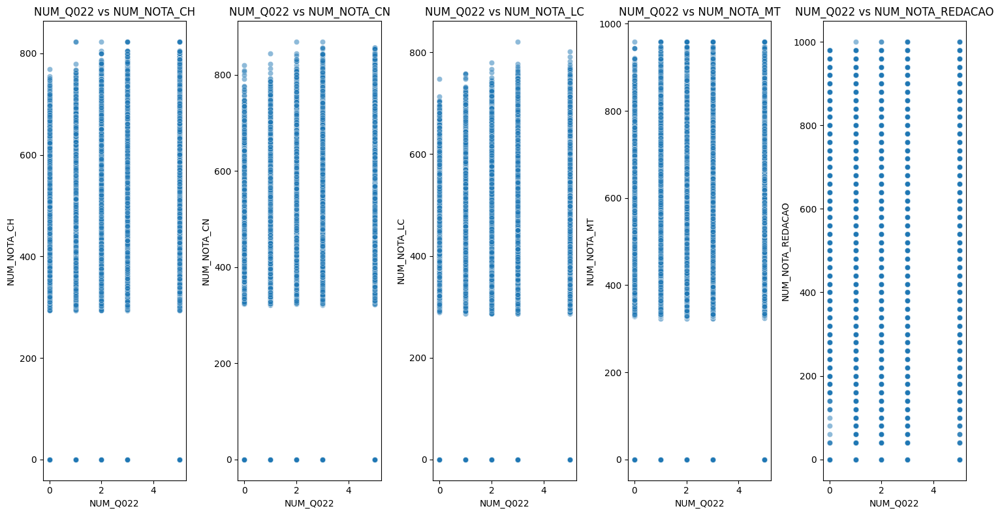

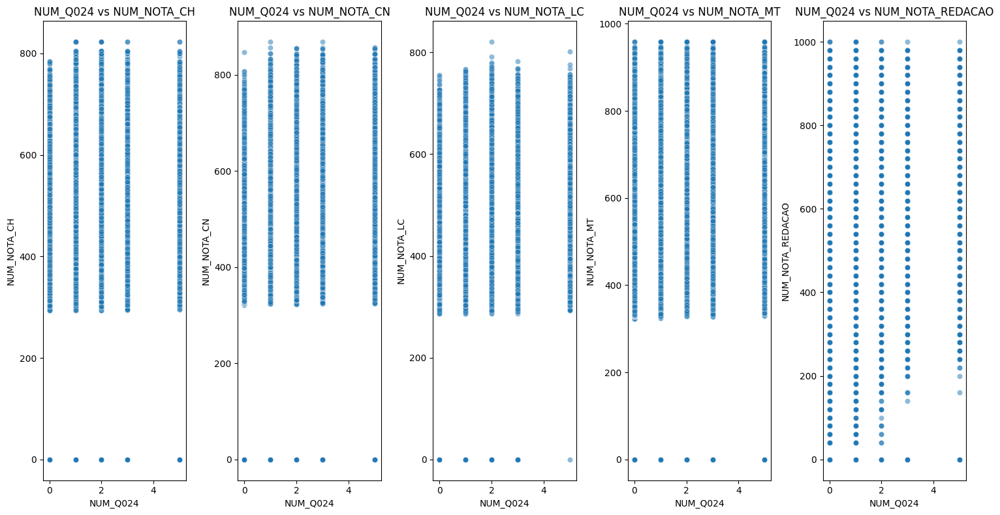

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de variáveis-alvo
target_vars = ['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']

# Loop pelas variáveis numéricas
for col in df_enem_num.drop(columns=target_vars).columns:
    plt.figure(figsize=(15, 8))
    
    # Criar um subplot para cada variável-alvo
    for i, target in enumerate(target_vars, 1):
        plt.subplot(1, 5, i)
        sns.scatterplot(x=df_enem[col], y=df_enem[target], alpha=0.5)
        plt.title(f'{col} vs {target}')
        plt.xlabel(col)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

## Analise variáveis binárias

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

Verificar proporção entre verdadeiro e falsos

BIN_Q001_DUMMY_H
False    0.895602
True     0.104398
Name: proportion, dtype: float64


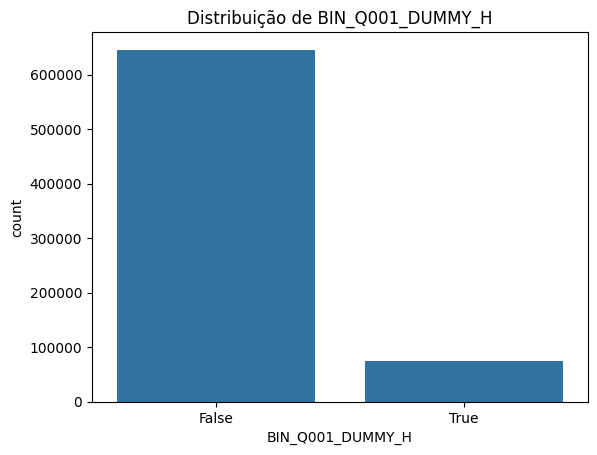

BIN_Q002_DUMMY_H
False    0.960319
True     0.039681
Name: proportion, dtype: float64


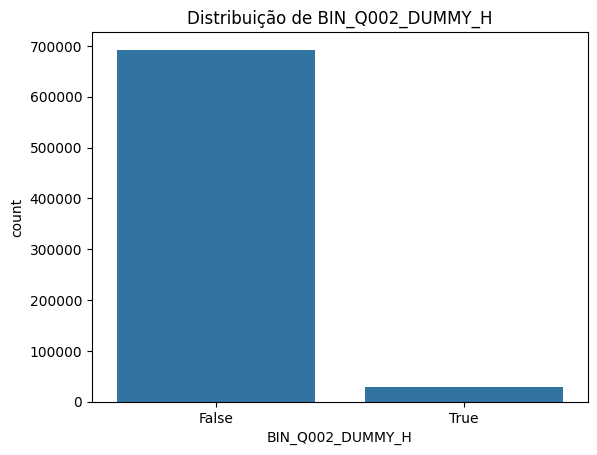

BIN_Q018
False    0.677017
True     0.322983
Name: proportion, dtype: float64


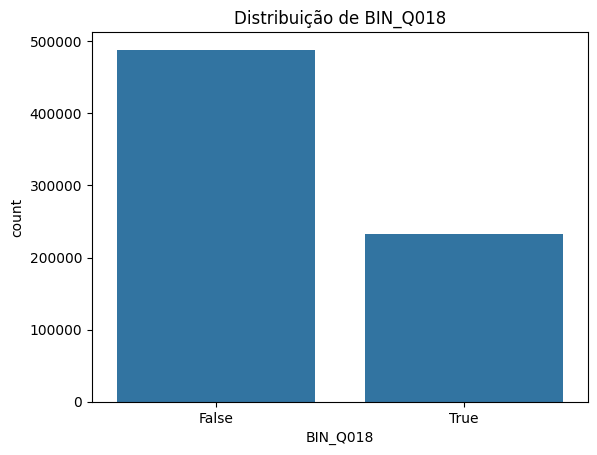

BIN_Q020
False    0.833634
True     0.166366
Name: proportion, dtype: float64


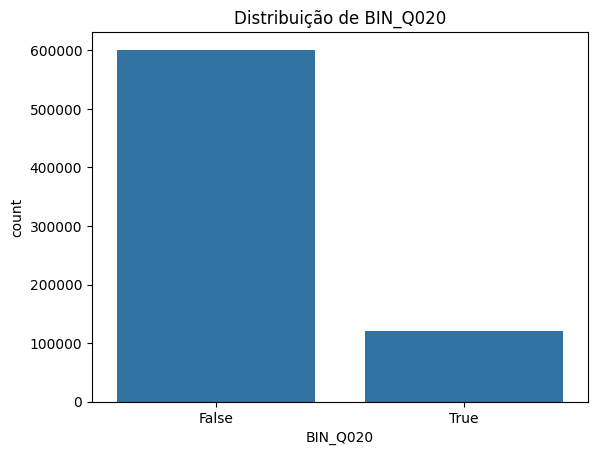

BIN_Q021
False    0.713016
True     0.286984
Name: proportion, dtype: float64


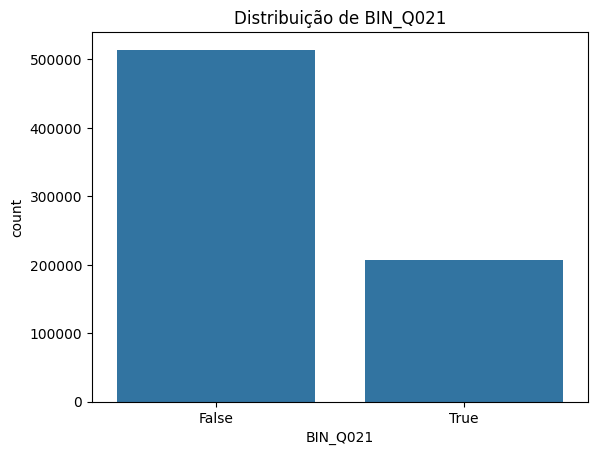

BIN_Q023
False    0.880507
True     0.119493
Name: proportion, dtype: float64


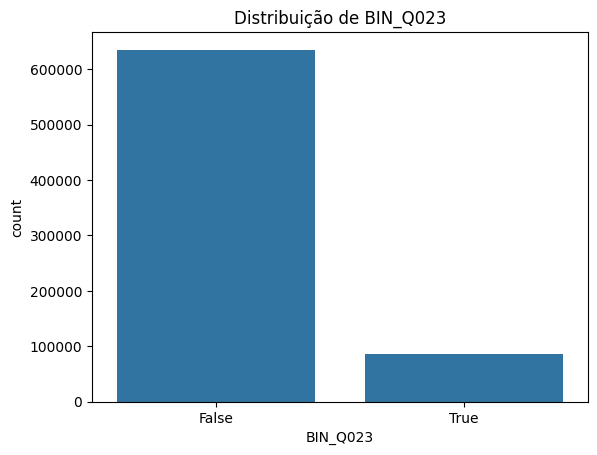

BIN_Q025
True     0.931372
False    0.068628
Name: proportion, dtype: float64


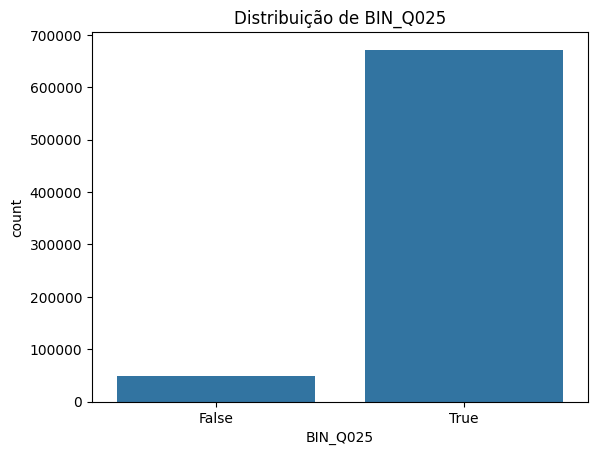

In [14]:
# proporção

for col in df_enem_bin:
    print(df_enem[col].value_counts(normalize=True))
    sns.countplot(data=df_enem, x=col)
    plt.title(f'Distribuição de {col}')
    plt.show()

Verificar se possuir true aumenta ou diminui a nota em geral

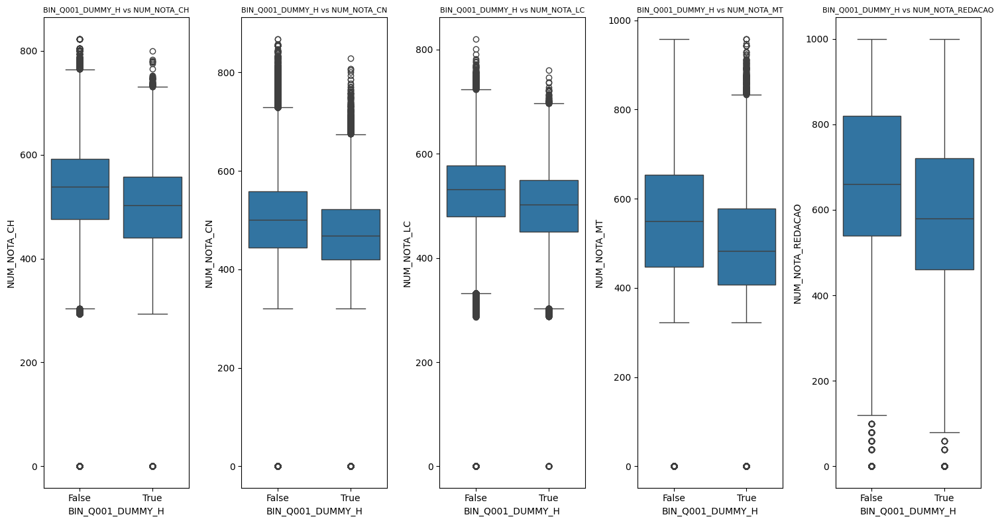

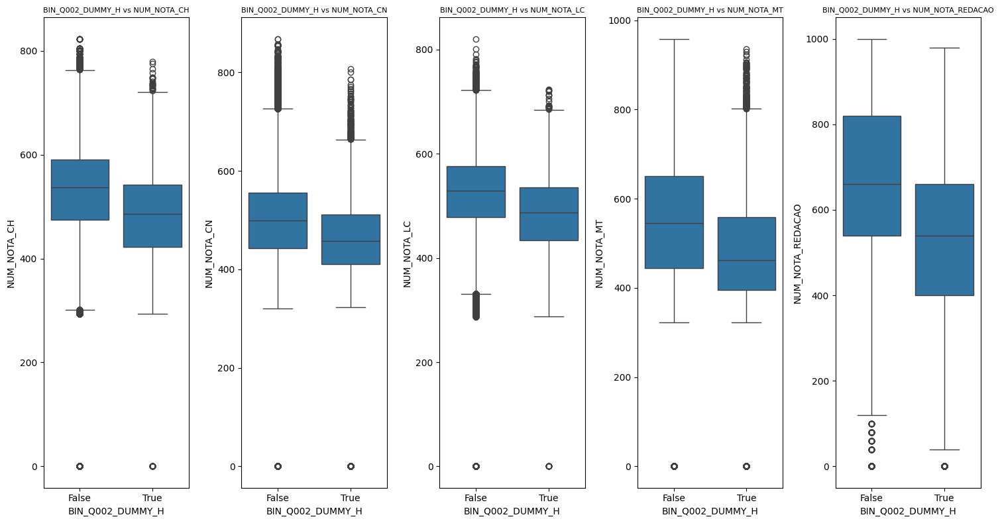

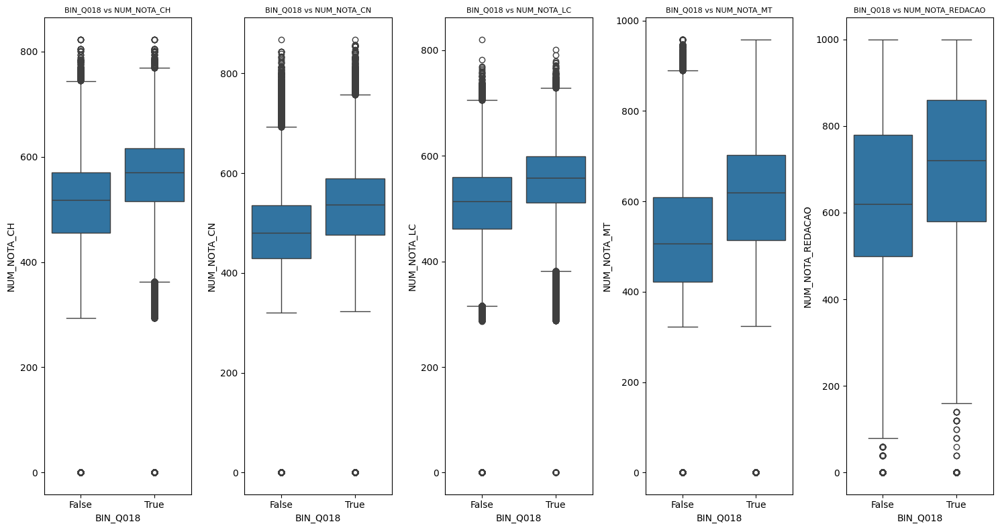

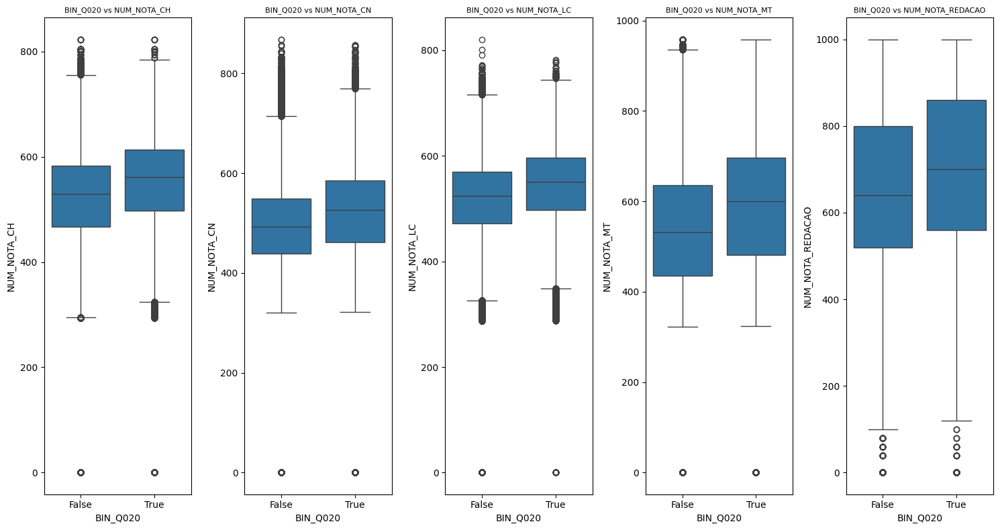

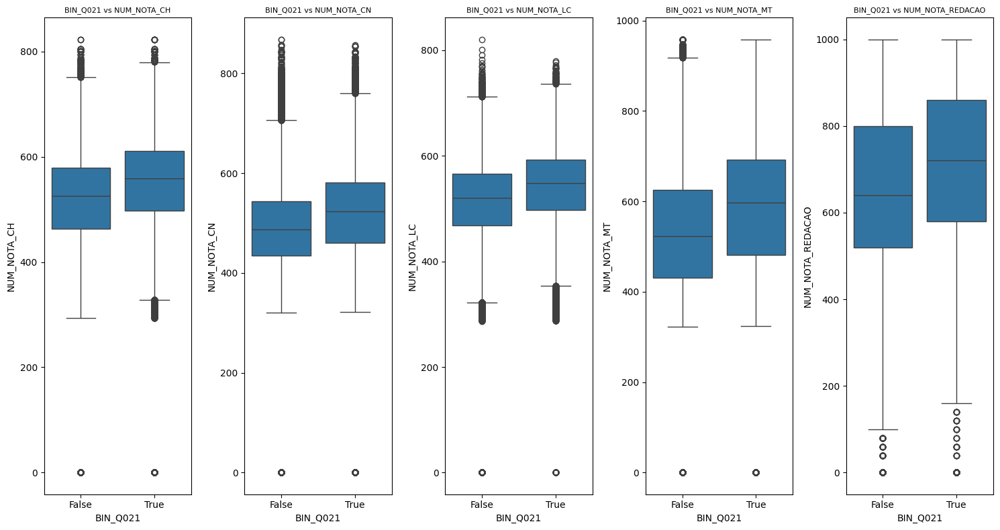

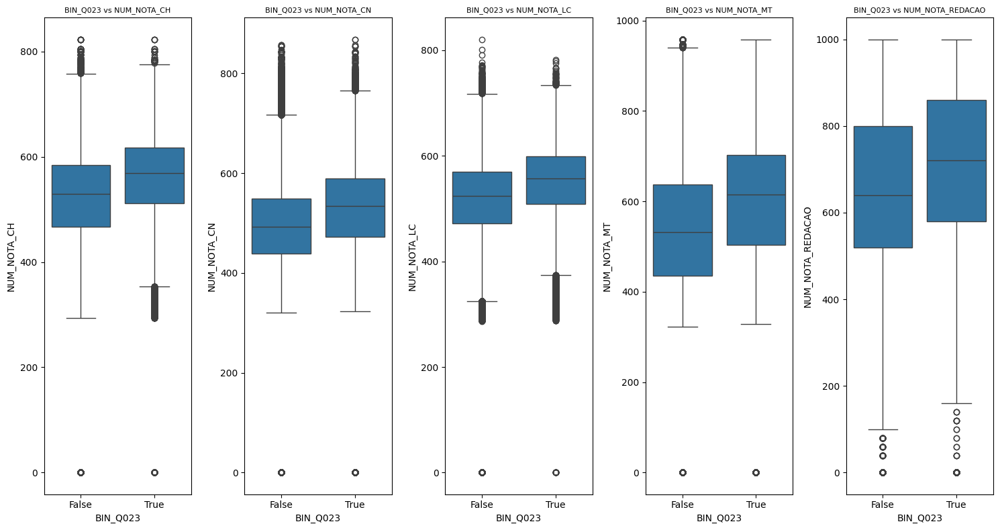

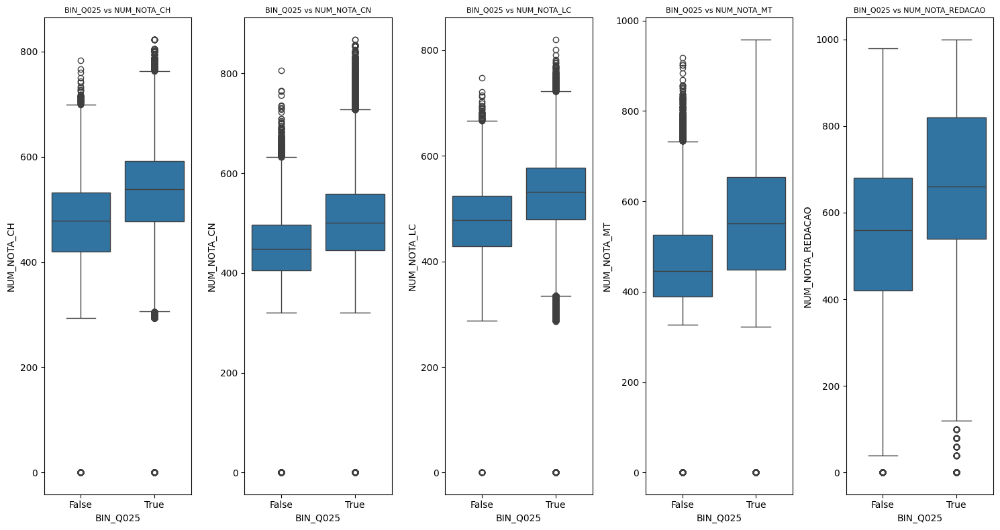

In [15]:
# relação variável alvo com subplot com 5 variáveis
for col in df_enem_bin:
    plt.figure(figsize=(15, 8))
    
    # Criar um subplot para cada variável-alvo
    for i, target in enumerate(target_vars, 1):
        plt.subplot(1, 5, i)
        sns.boxplot(x=df_enem[col], y=df_enem[target])
        plt.title(f'{col} vs {target}', size=8)
        plt.xlabel(col)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

## Analise variáveis categóricas

#### 1. Verificar classes desbalanceadas ou padrões claros

CAT_COR_RACA
1    348796
3    281529
2     68860
4     10450
0      8077
5      3336
Name: count, dtype: int64


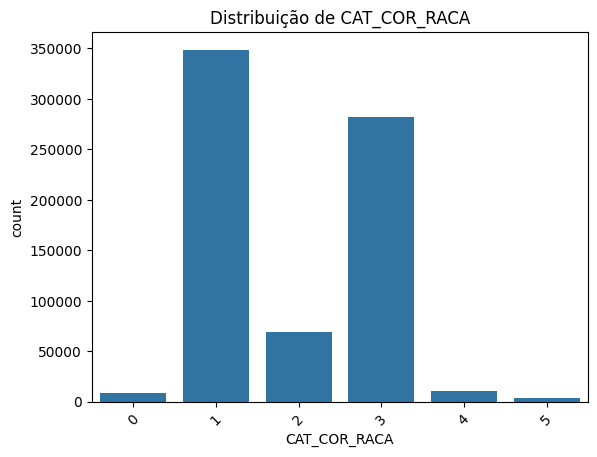

CAT_CO_UF_ESC
35    141284
23     74252
31     52823
33     49392
41     39925
29     34936
26     34632
43     32066
52     28277
15     27949
42     23650
21     23489
25     18010
53     16817
32     16080
13     14618
22     14553
24     14418
27     13940
51     12271
50      9227
28      8450
11      7041
17      4987
16      3459
12      2916
14      1586
Name: count, dtype: int64


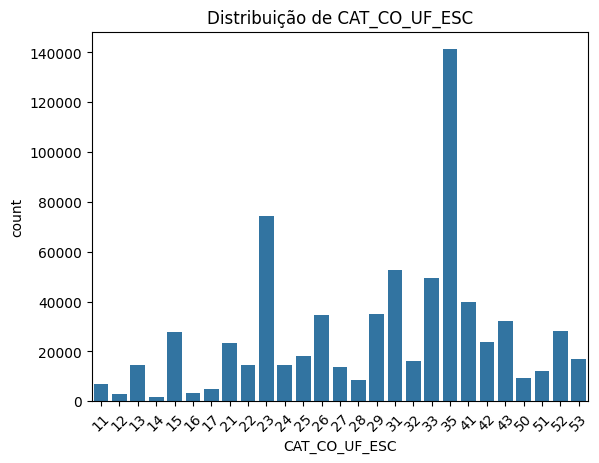

CAT_DEPENDENCIA_ADM_ESC
2    456607
4    214671
1     43940
3      5830
Name: count, dtype: int64


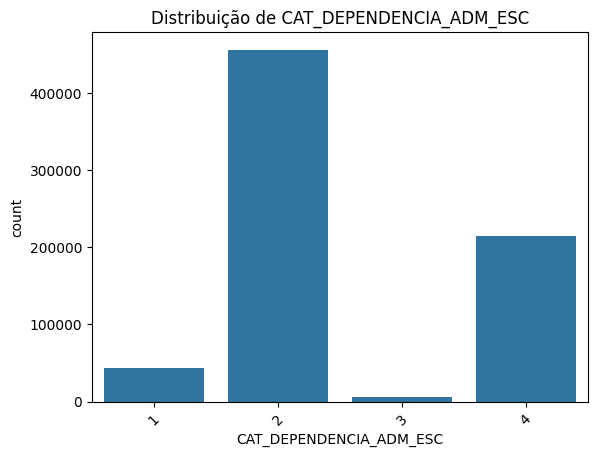

CAT_ENSINO
1    705880
0     12805
2      2363
Name: count, dtype: int64


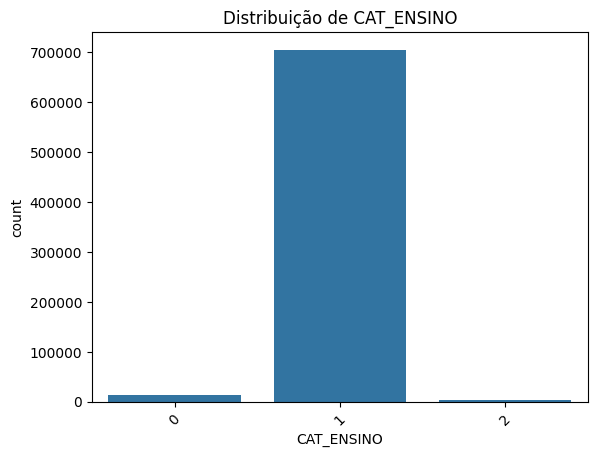

CAT_ESCOLA
2    526875
3    194173
1         0
Name: count, dtype: int64


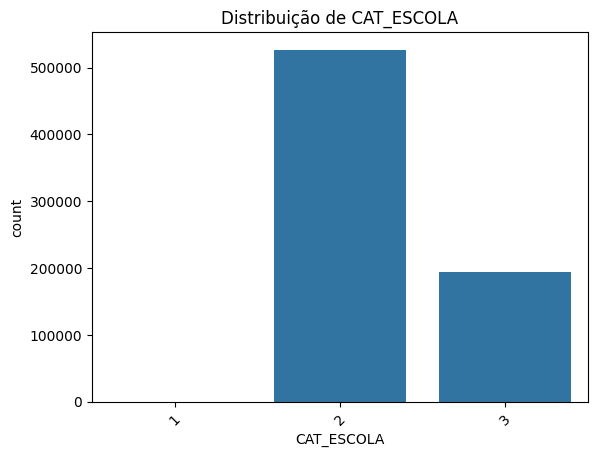

CAT_ESTADO_CIVIL
1    685487
0     26045
3      5150
2      4171
4       195
Name: count, dtype: int64


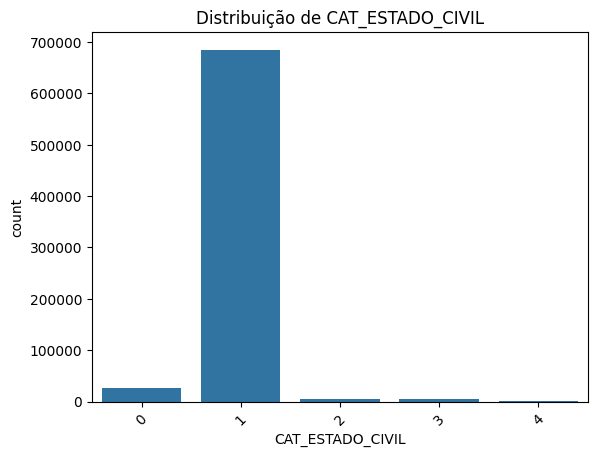

CAT_FAIXA_ETARIA
3     359254
2     286577
4      47819
5      10614
1       5590
6       3113
11      1445
7       1281
12       960
13       906
8        787
14       603
9        514
15       484
10       393
16       369
17       195
18        86
19        43
20        15
Name: count, dtype: int64


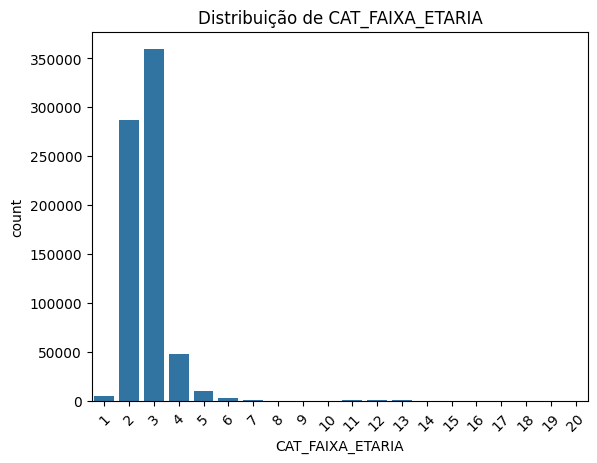

CAT_LINGUA
0    453509
1    267539
Name: count, dtype: int64


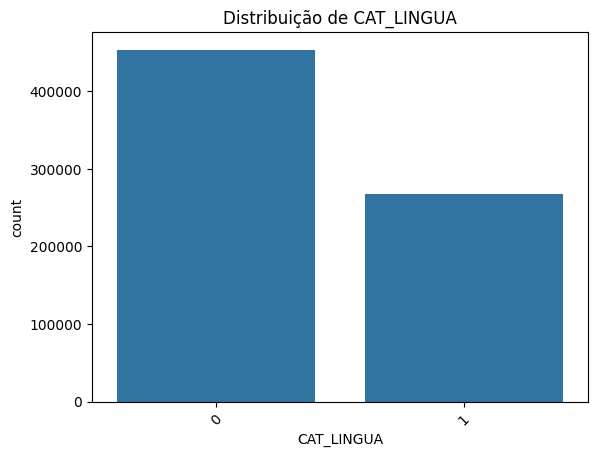

CAT_LOCALIZACAO_ESC
1    696754
2     24294
Name: count, dtype: int64


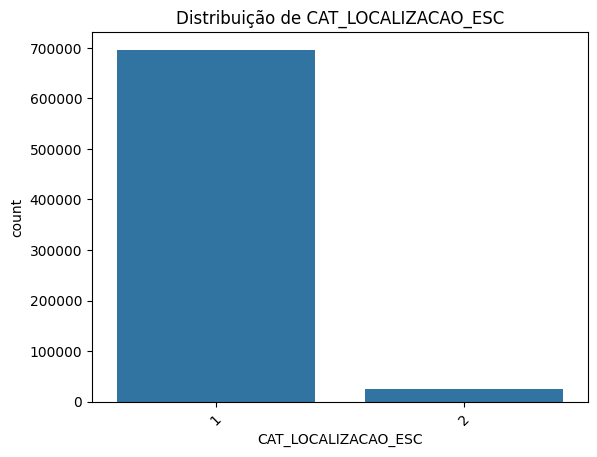

CAT_NACIONALIDADE
1    705863
2     11711
4      1965
3      1509
0         0
Name: count, dtype: int64


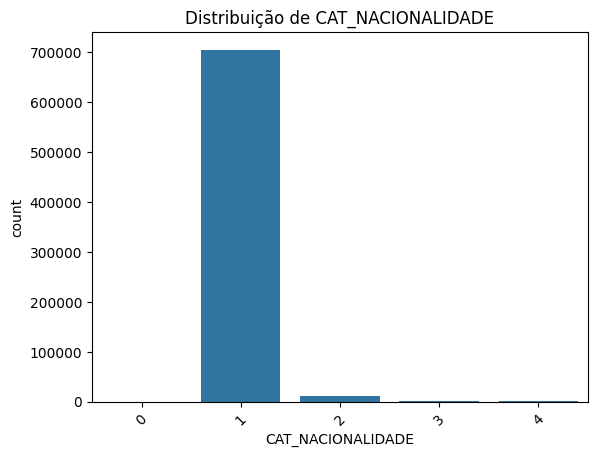

CAT_Q003
D    169508
C    164693
B    126306
A     98936
F     87283
E     74322
Name: count, dtype: int64


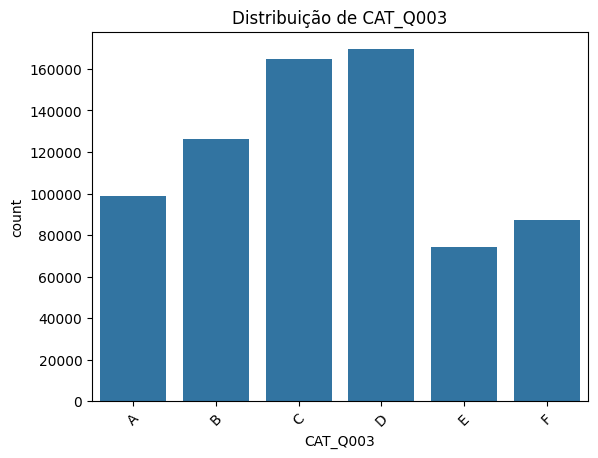

CAT_Q004
B    262438
D    209648
A     77786
F     68063
E     55983
C     47130
Name: count, dtype: int64


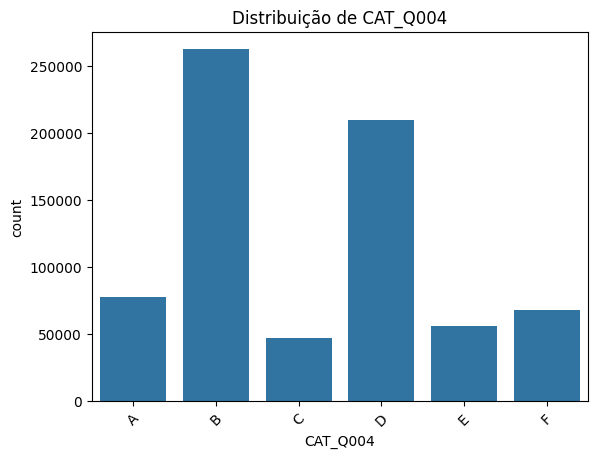

CAT_SEXO
F    399695
M    321353
Name: count, dtype: int64


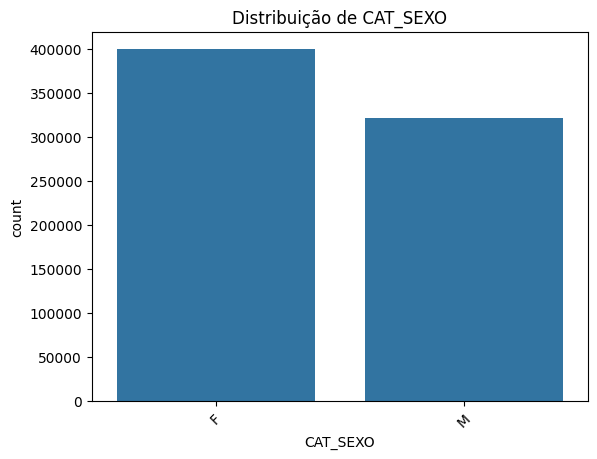

CAT_SIT_FUNC_ESC
1    714927
4      3139
2      2546
3       436
Name: count, dtype: int64


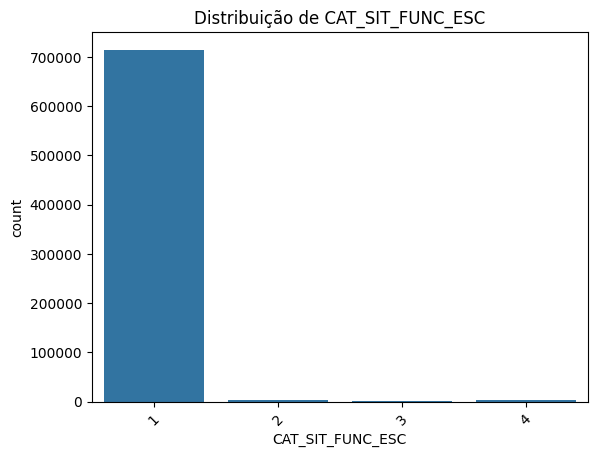

In [16]:
# CONTAGEM

for col in df_enem_cat.drop(columns=['CAT_CO_MUNICIPIO_ESC']):
    print(df_enem[col].value_counts())
    sns.countplot(data=df_enem, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Distribuição de {col}')
    plt.show()


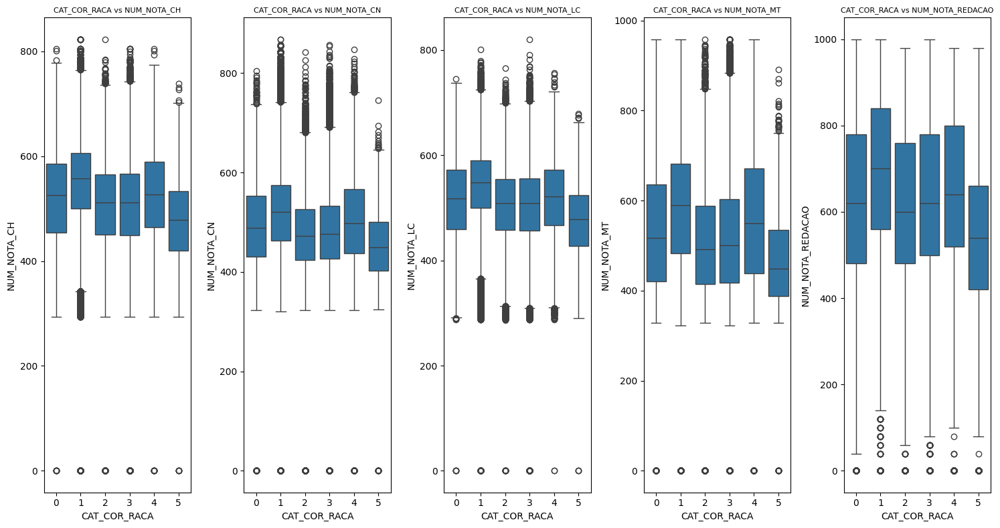

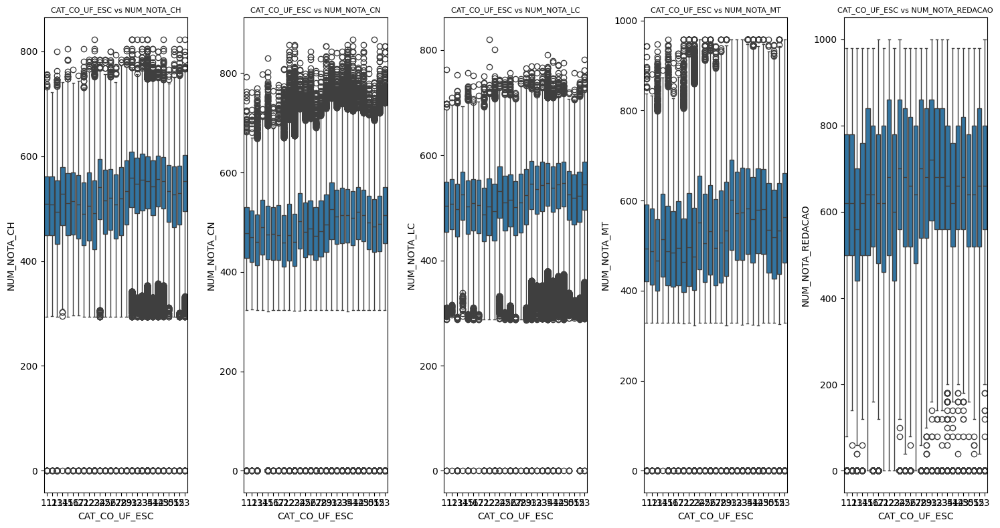

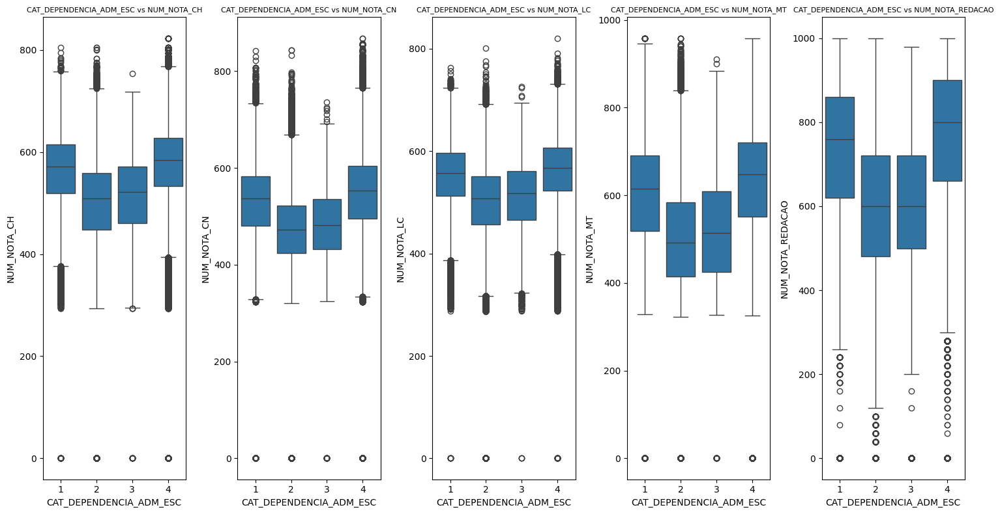

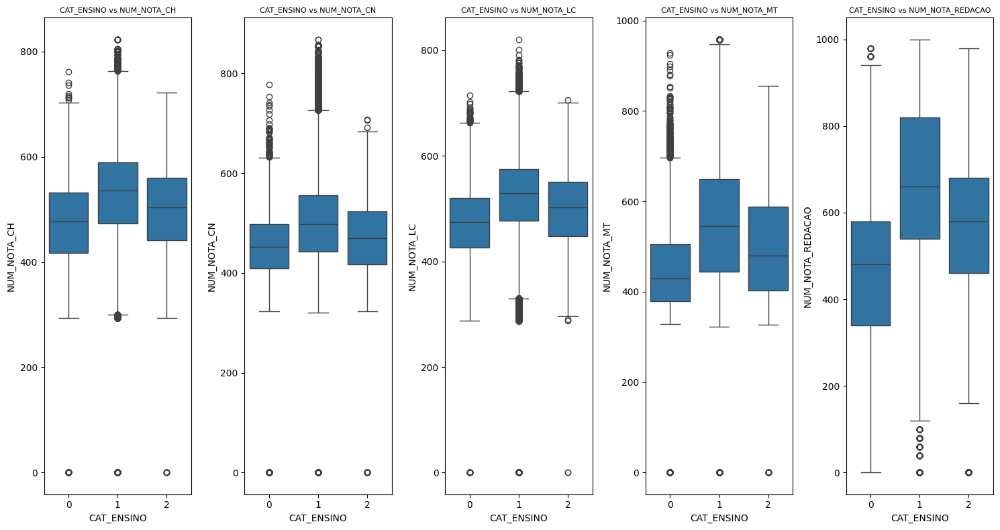

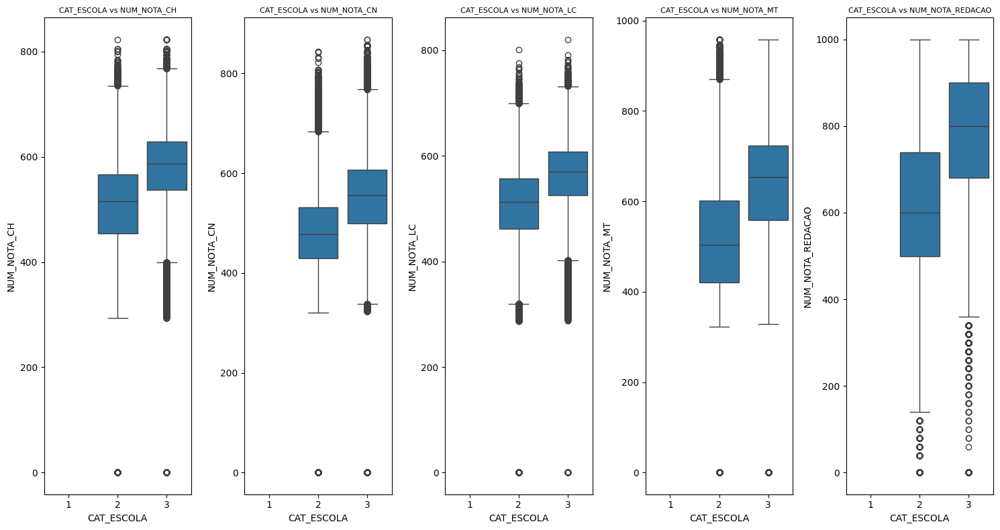

...

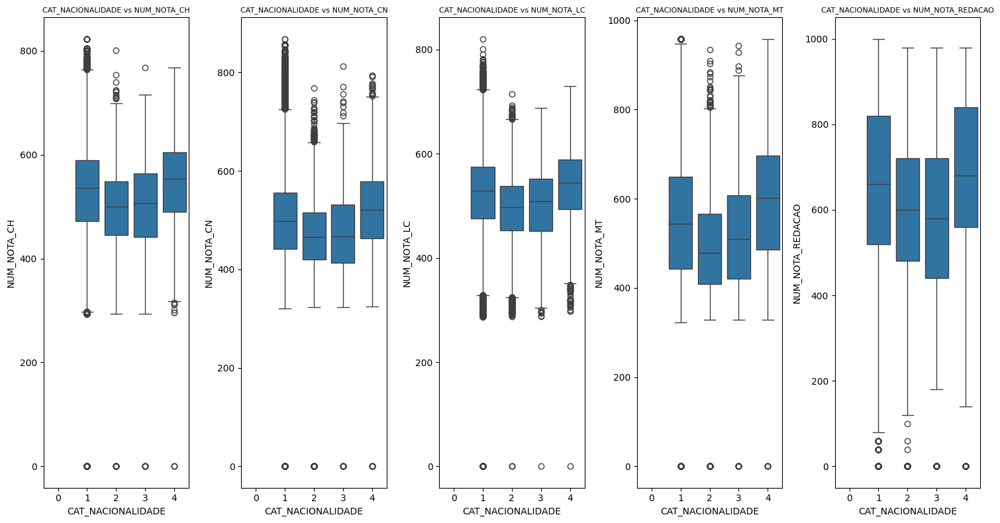

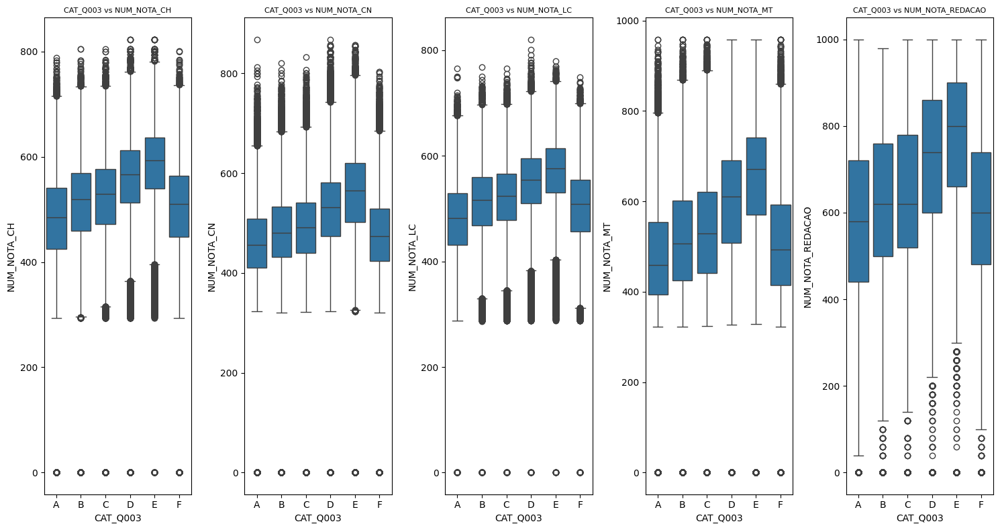

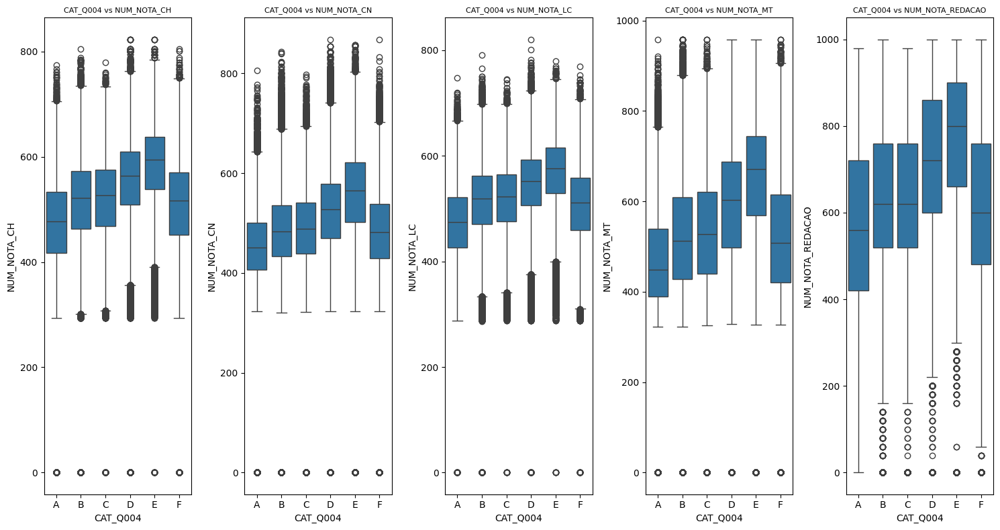

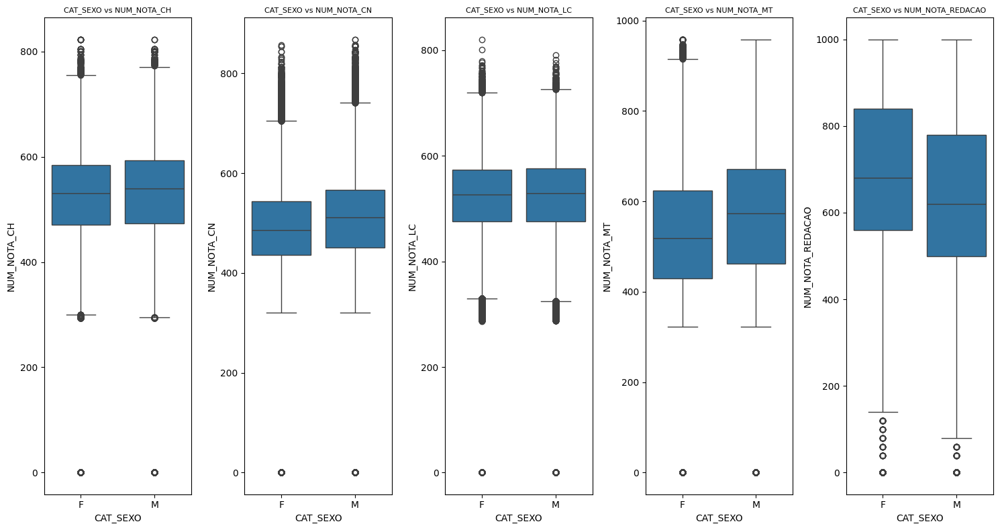

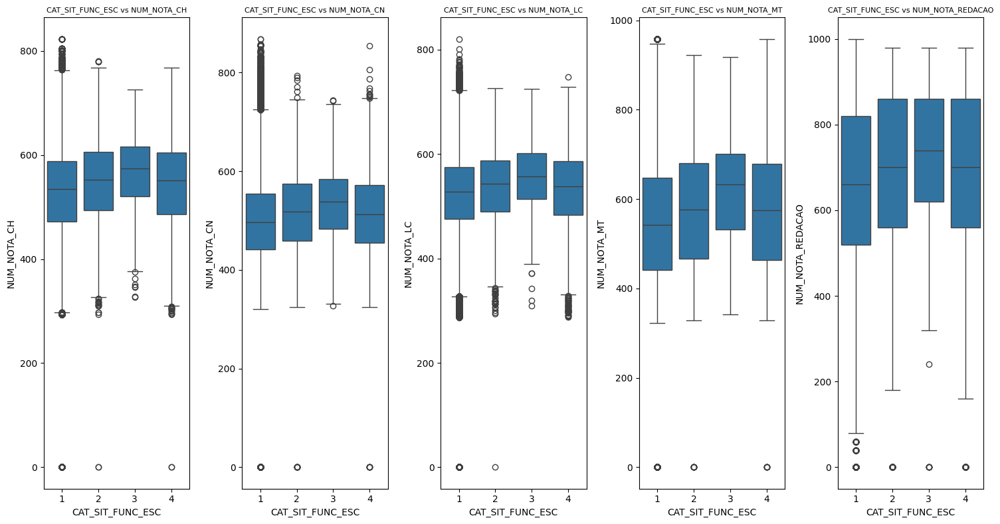

In [17]:
# porporção categoria por alvo
for col in df_enem_cat.drop(columns=['CAT_CO_MUNICIPIO_ESC']):
    plt.figure(figsize=(15, 8))
    
    # Criar um subplot para cada variável-alvo
    for i, target in enumerate(target_vars, 1):
        plt.subplot(1, 5, i)
        sns.boxplot(x=df_enem[col], y=df_enem[target])
        plt.title(f'{col} vs {target}', size=8)
        plt.xlabel(col)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

In [18]:
df_enem_cat.columns.to_list()

['CAT_COR_RACA',
 'CAT_CO_MUNICIPIO_ESC',
 'CAT_CO_UF_ESC',
 'CAT_DEPENDENCIA_ADM_ESC',
 'CAT_ENSINO',
 'CAT_ESCOLA',
 'CAT_ESTADO_CIVIL',
 'CAT_FAIXA_ETARIA',
 'CAT_LINGUA',
 'CAT_LOCALIZACAO_ESC',
 'CAT_NACIONALIDADE',
 'CAT_Q003',
 'CAT_Q004',
 'CAT_SEXO',
 'CAT_SIT_FUNC_ESC']

CAT_CO_UF_ESC    11    12    13   14     15    16    17     21    22     23  \
CAT_COR_RACA                                                                  
0                71    53   216   23    364    40    46    159   170   1799   
1              2423   779  3329  474   7447   962  1437   5478  3853  18979   
2               639   284   726  122   3152   416   656   3036  1824   5496   
3              3728  1683  9734  876  16376  1990  2704  14449  8355  46825   
4               136    83   218    9    453    37   102    260   273    746   
5                44    34   395   82    157    14    42    107    78    407   

CAT_CO_UF_ESC  ...    32     33     35     41     42     43    50    51  \
CAT_COR_RACA   ...                                                        
0              ...   116    484   1035    418    213    292    87   118   
1              ...  7560  27162  92456  28495  19184  26559  5048  5122   
2              ...  1936   6789  11158   1498    735   1437   498  

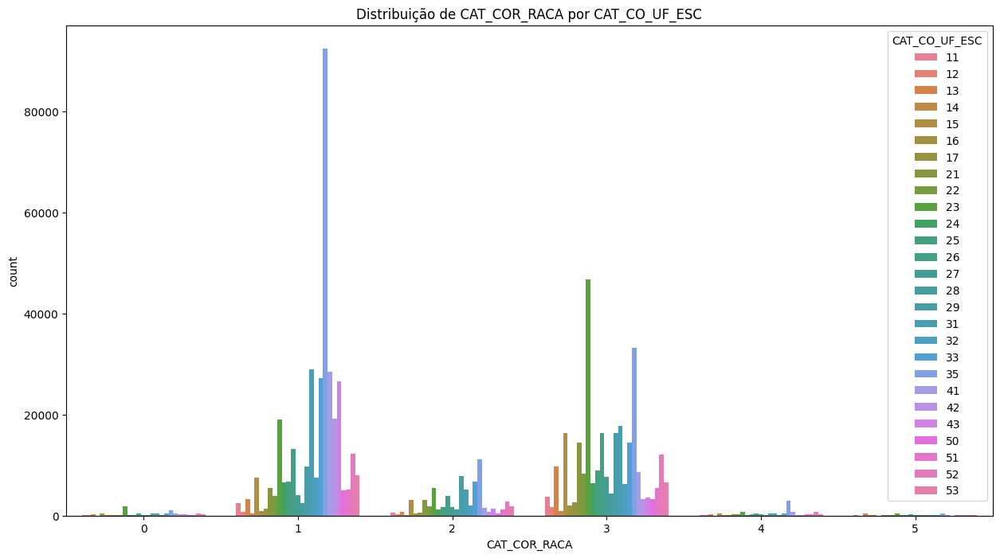

CAT_ESTADO_CIVIL      0       1     2     3   4
CAT_COR_RACA                                   
0                  1225    6741    61    49   1
1                 11349  333542  1485  2351  69
2                  2478   65148   528   678  28
3                 10220  267287  1981  1948  93
4                   589    9691    75    93   2
5                   184    3078    41    31   2


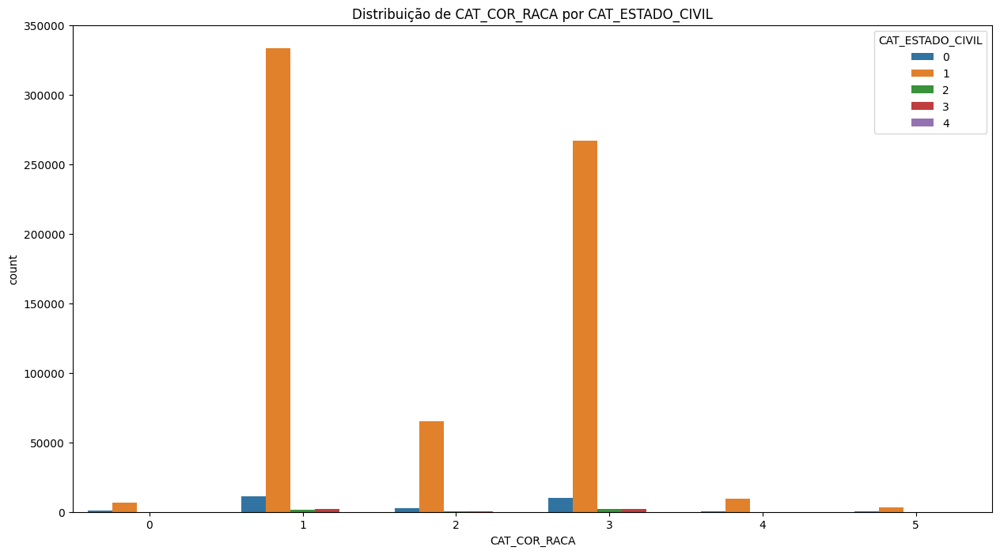

CAT_FAIXA_ETARIA     1       2       3      4     5     6    7    8    9   10  \
CAT_COR_RACA                                                                    
0                   57    2996    3993    638   186    51   23   21    9    8   
1                 2810  151724  170849  17625  3252   783  300  176  115   78   
2                  411   22903   35147   6831  1732   553  215  142   92   61   
3                 2193  103607  142598  21676  5162  1628  707  419  276  235   
4                   95    4274    5001    723   168    63   20   16   15    8   
5                   24    1073    1666    326   114    35   16   13    7    3   

CAT_FAIXA_ETARIA   11   12   13   14   15   16  17  18  19  20  
CAT_COR_RACA                                                    
0                  25   19   16   15    6   11   2   1   0   0  
1                 281  175  157  140  131  105  46  26  16   7  
2                 215  142  136   84   76   50  48  11   9   2  
3                 878  596

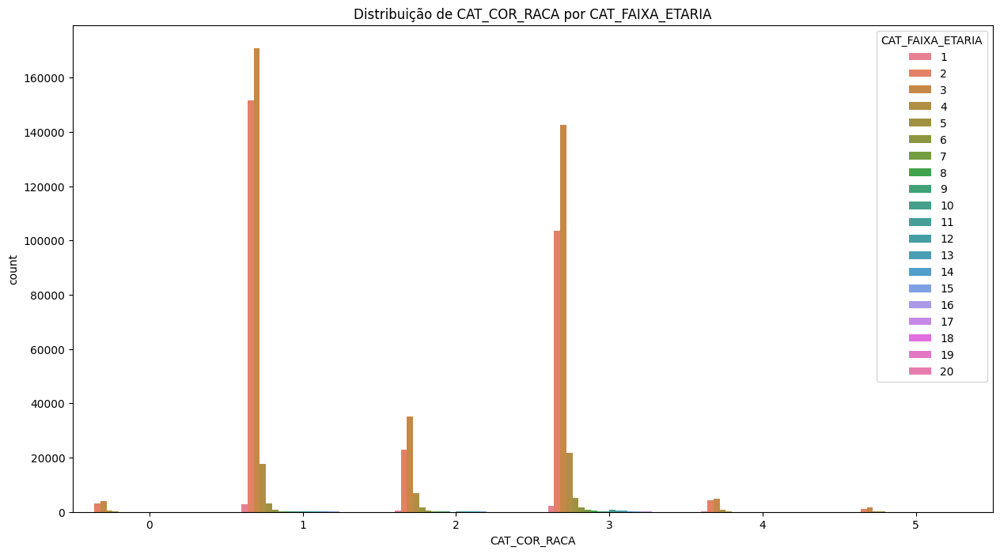

CAT_LINGUA         0       1
CAT_COR_RACA                
0               4723    3354
1             251759   97037
2              38688   30172
3             150281  131248
4               6626    3824
5               1432    1904


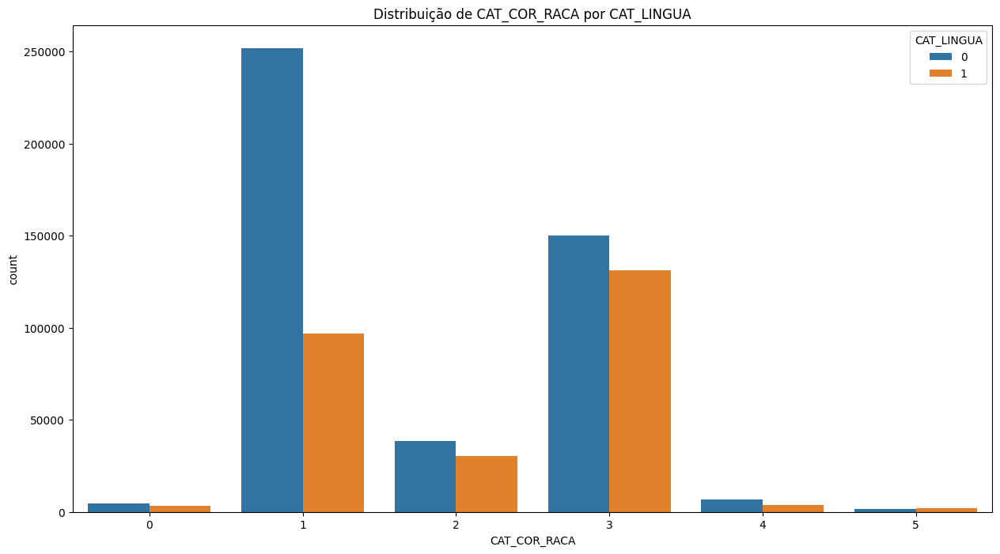

CAT_Q003          A      B      C       D      E      F
CAT_COR_RACA                                           
0              1235   1367   1523    1559    689   1704
1             30711  49979  74749  103198  55681  34478
2              9442  15947  18656   11246   2692  10877
3             55068  56678  67117   50517  13800  38349
4              1505   1686   2024    2519   1341   1375
5               975    649    624     469    119    500


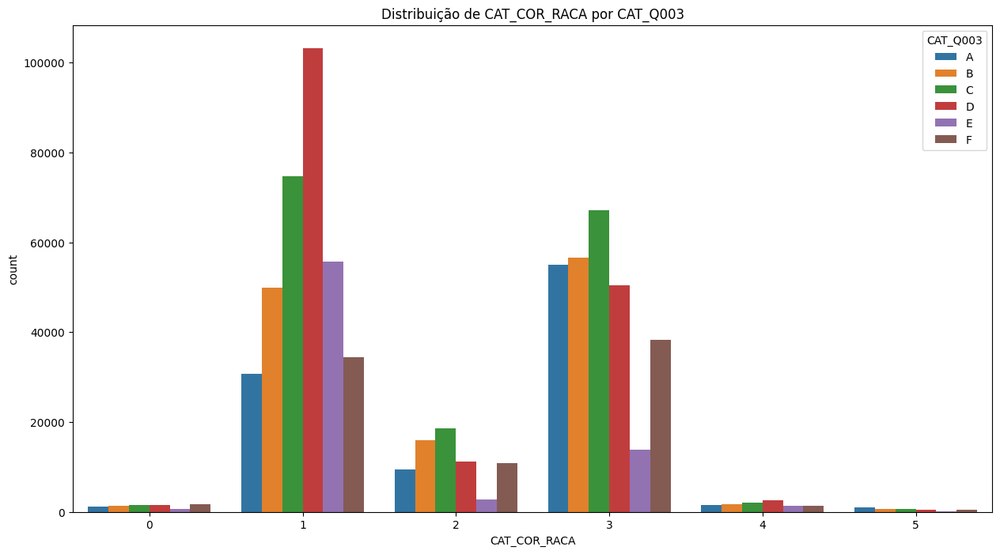

CAT_Q004          A       B      C       D      E      F
CAT_COR_RACA                                            
0              1022    2644    514    1894    513   1490
1             20902  109931  21665  124435  42074  29789
2              7589   32048   5051   15474   2109   6589
3             46247  113103  18967   64320  10188  28704
4              1150    3534    736    2884   1023   1123
5               876    1178    197     641     76    368


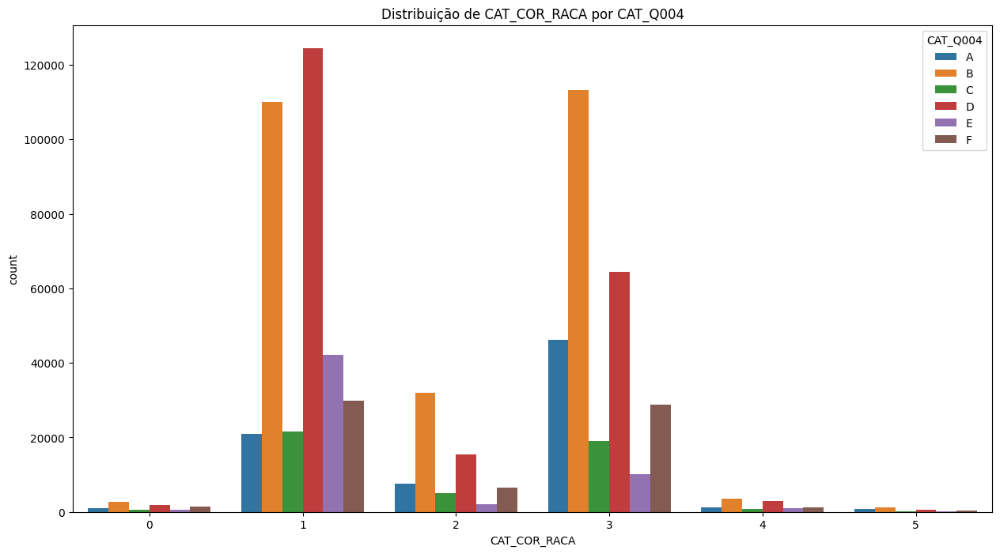

CAT_SEXO           F       M
CAT_COR_RACA                
0               4394    3683
1             194832  153964
2              36620   32240
3             156043  125486
4               6003    4447
5               1803    1533


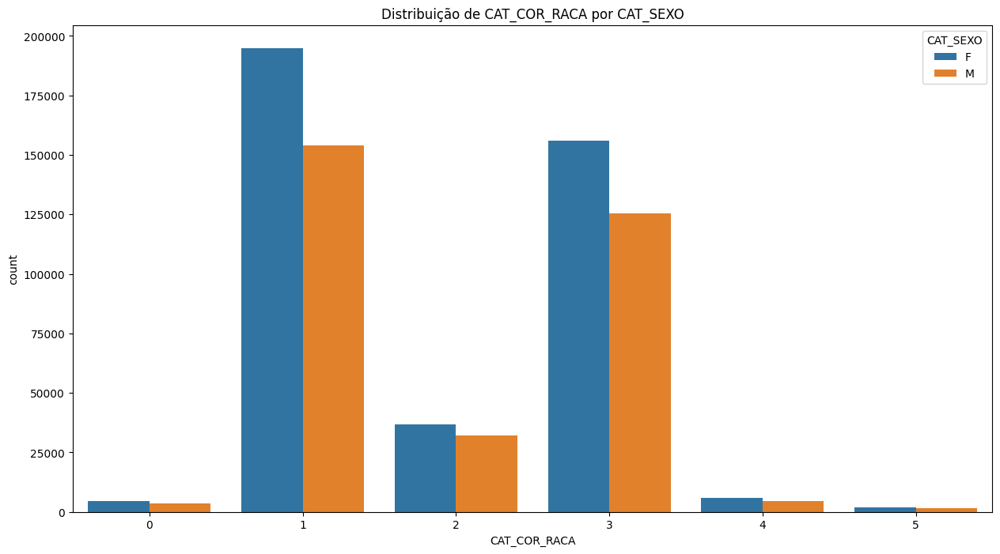

CAT_ESTADO_CIVIL     0       1    2     3   4
CAT_CO_UF_ESC                                
11                 355    6545   85    51   5
12                 177    2689   22    28   0
13                 554   13837   90   132   5
14                  67    1492    3    24   0
15                1248   26335  185   173   8
16                 180    3247   19    13   0
17                 189    4726   23    46   3
21                1159   22046  123   159   2
22                 798   13514  145    91   5
23                3168   70188  447   415  34
24                 475   13751   91    97   4
25                 707   17007  180   109   7
26                1257   32961  187   216  11
27                 550   13017  230   127  16
28                 375    7984   32    57   2
29                1460   33032  198   236  10
31                1575   50549  278   411  10
32                 500   15366   95   118   1
33                1113   47616  287   366  10
35                4121  135513  60

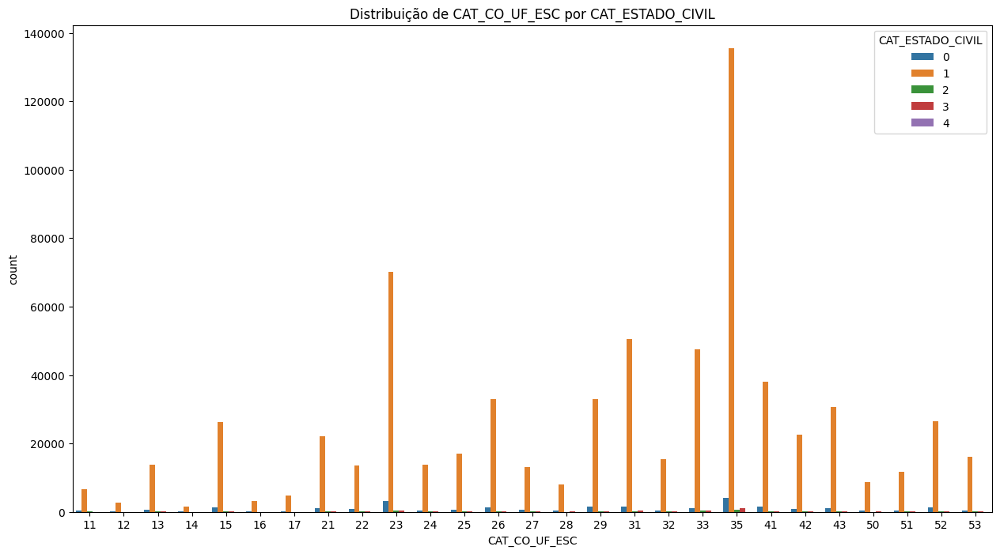

CAT_FAIXA_ETARIA    1      2      3     4     5    6    7    8   9  10   11  \
CAT_CO_UF_ESC                                                                 
11                 32   2049   4328   433    73   25   11    7   8   8   18   
12                 24   1093   1504   205    43   14    7    4   4   1    9   
13                118   5241   7713  1065   186   70   21   24  13   8   59   
14                 13    451   1004    96    14    3    2    1   1   0    1   
15                469   9712  12794  3036   931  287  142   83  56  42  129   
16                 38   1184   1602   444   105   26   18    6   5   4   13   
17                 96   2212   2257   295    61   17   14    3   6   3    7   
21                364   9480  10972  1912   418  136   43   27  13   6   34   
22                254   5115   6785  1483   426  130   57   32  25  17   65   
23                258  27991  37749  5239  1293  419  192  101  80  62  263   
24                170   4126   6810  2140   644  213

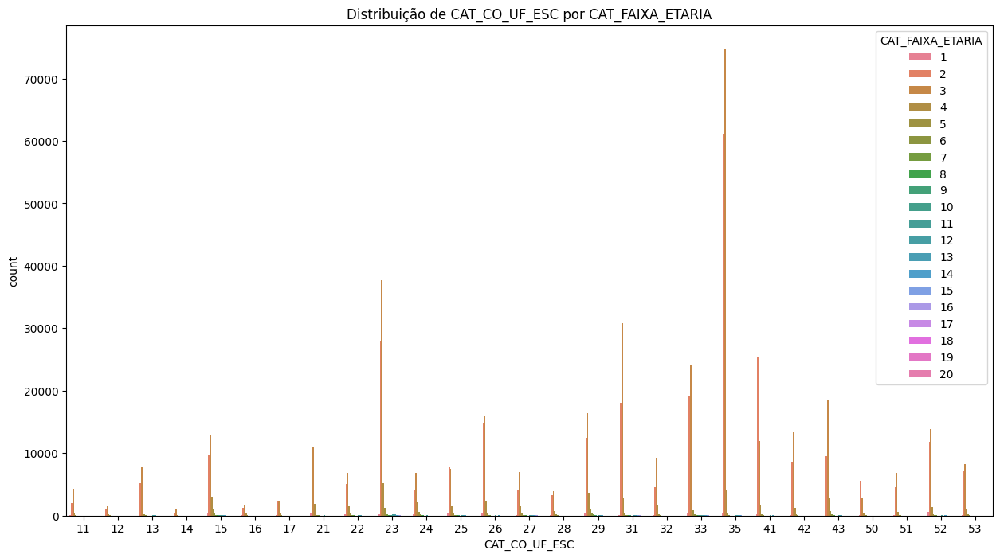

CAT_LINGUA          0      1
CAT_CO_UF_ESC               
11               2661   4380
12                936   1980
13               8781   5837
14                525   1061
15              15602  12347
16               1514   1945
17               2641   2346
21              11355  12134
22               5308   9245
23              27683  46569
24               7741   6677
25               9273   8737
26              21285  13347
27               8056   5884
28               3807   4643
29              23302  11634
31              40703  12120
32              10835   5245
33              36623  12769
35             110131  31153
41              28900  11025
42              18341   5309
43              19087  12979
50               6319   2908
51               6705   5566
52              15203  13074
53              10192   6625


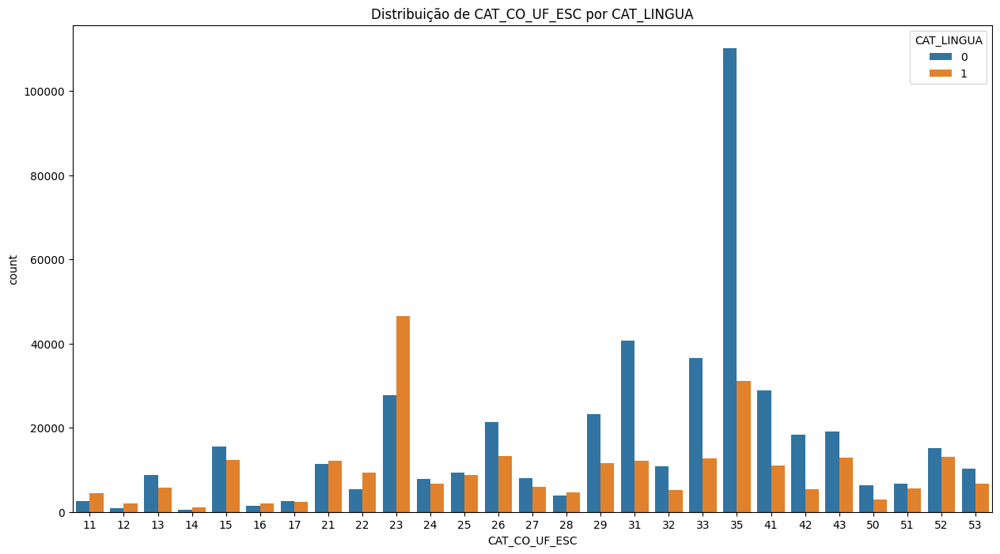

CAT_Q003           A      B      C      D      E      F
CAT_CO_UF_ESC                                          
11              1373   1242   1433   1550    492    951
12               482    649    474    648    193    470
13              2097   2886   3034   3013   1061   2527
14               138    275    295    447    187    244
15              5122   5817   5603   5679   1775   3953
16               351    831    618    836    308    515
17              1091    777    955   1089    475    600
21              7665   4246   4079   3799   1068   2632
22              4246   2827   2310   2637    905   1628
23             23388  15821  12095   7986   2559  12403
24              2520   2791   2890   3483   1179   1555
25              4996   3633   3159   3101   1201   1920
26              6634   7060   7087   6741   2742   4368
27              3121   2836   2773   2356    890   1964
28              1991   1552   1717   1614    583    993
29              6166   6181   7428   8218   3047

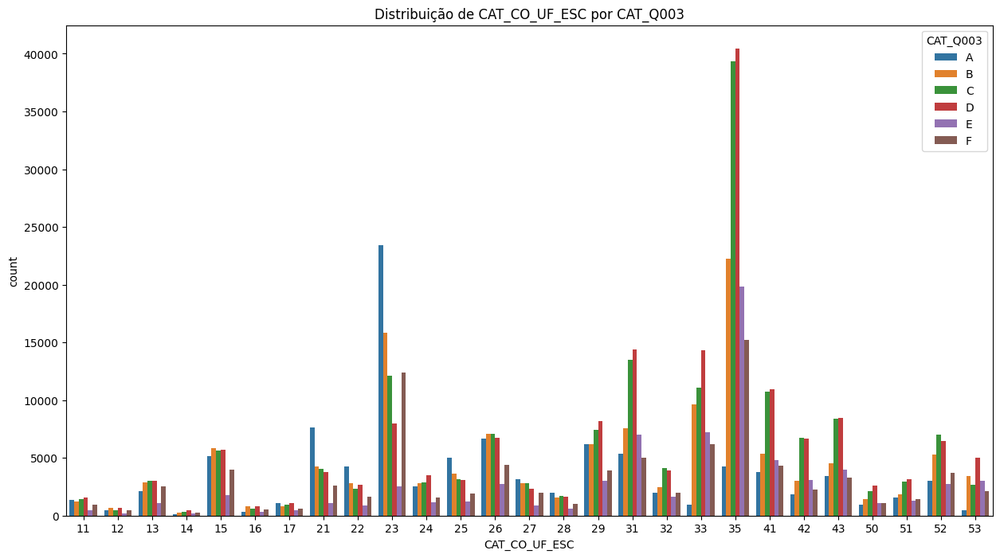

CAT_Q004           A      B      C      D      E      F
CAT_CO_UF_ESC                                          
11               914   2657    430   1854    426    760
12               286   1228    112    811    169    310
13              1860   5534   1125   3546    824   1729
14                70    548     78    597    140    153
15              4038  11367   1335   7100   1383   2726
16               264   1456    146   1048    225    320
17               768   1676    190   1572    368    413
21              7210   7614    880   5333    847   1605
22              3901   4988    593   3320    640   1111
23             21056  25817   5197  10267   1966   9949
24              2337   5224    769   3860    947   1281
25              4814   6219    708   3905    873   1491
26              6197  12311   1824   8570   2216   3514
27              2739   5280    572   3078    705   1566
28              1811   2984    359   2044    422    830
29              4916  12586   1760  10336   2441

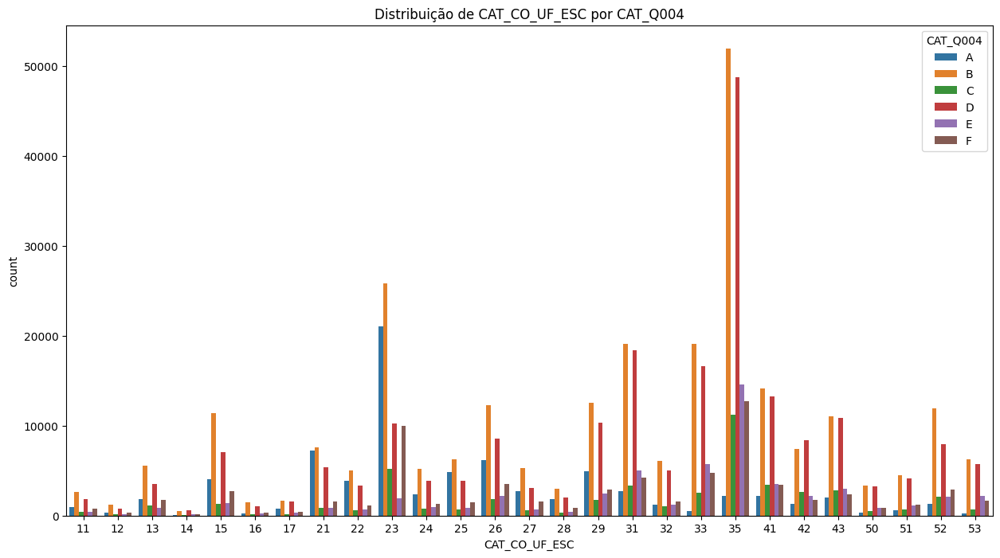

CAT_SEXO           F      M
CAT_CO_UF_ESC              
11              4057   2984
12              1609   1307
13              8044   6574
14               939    647
15             15571  12378
16              1812   1647
17              2801   2186
21             13332  10157
22              8011   6542
23             39064  35188
24              7939   6479
25              9722   8288
26             19027  15605
27              7823   6117
28              4685   3765
29             19722  15214
31             29296  23527
32              8881   7199
33             28025  21367
35             78634  62650
41             22136  17789
42             13454  10196
43             18124  13942
50              5087   4140
51              7022   5249
52             15461  12816
53              9417   7400


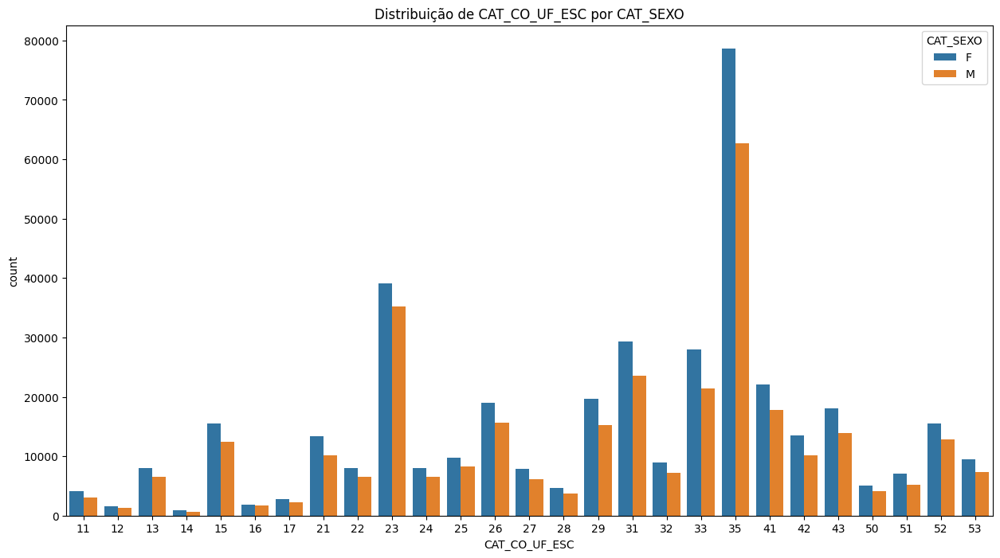

CAT_FAIXA_ETARIA     1       2       3      4      5     6     7    8    9  \
CAT_ESTADO_CIVIL                                                             
0                  208   10699   12273   1662    385   139    61   52   33   
1                 5342  273049  343237  45571  10080  2912  1180  686  449   
2                   10     915    1286    253     89    48    27   41   25   
3                   29    1871    2403    326     59    14    13    7    6   
4                    1      43      55      7      1     0     0    1    1   

CAT_FAIXA_ETARIA   10    11   12   13   14   15   16  17  18  19  20  
CAT_ESTADO_CIVIL                                                      
0                  25   156  104  110   57   27   28  15   7   4   0  
1                 323  1041  571  425  238  172  120  58  24   7   2  
2                  37   195  223  292  245  205  147  77  29  21   6  
3                   8    49   61   68   50   67   61  32  16   7   3  
4                   0     4

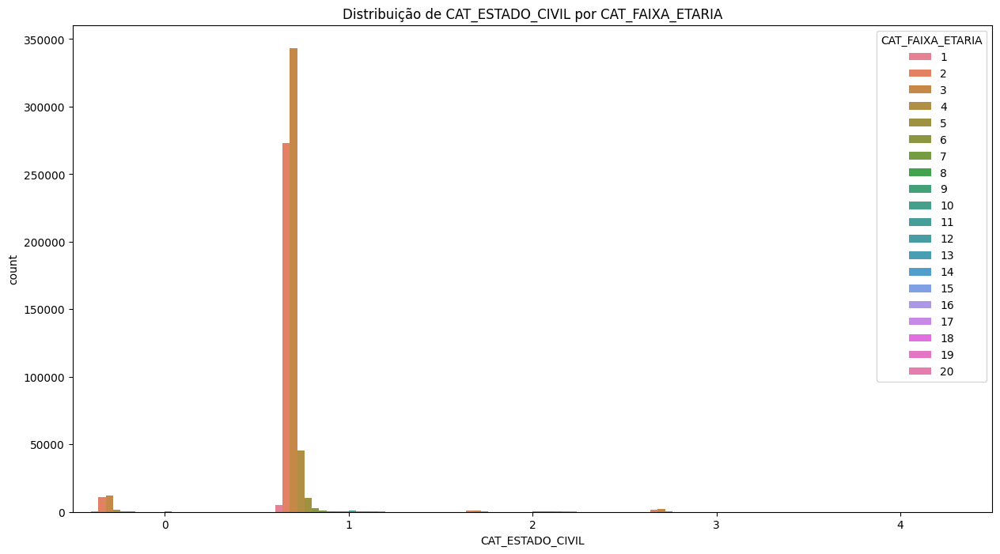

CAT_LINGUA             0       1
CAT_ESTADO_CIVIL                
0                  15868   10177
1                 432255  253232
2                   2076    2095
3                   3225    1925
4                     85     110


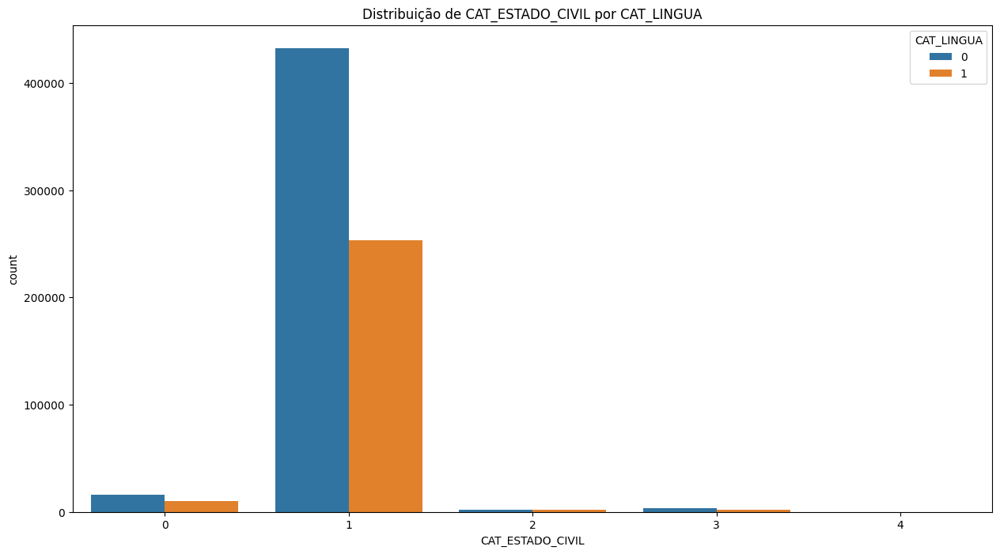

CAT_Q003              A       B       C       D      E      F
CAT_ESTADO_CIVIL                                             
0                  3878    4349    5507    5127   2465   4719
1                 93060  120273  157099  162735  71023  81297
2                  1294     670     827     593    284    503
3                   638     983    1224    1030    539    736
4                    66      31      36      23     11     28


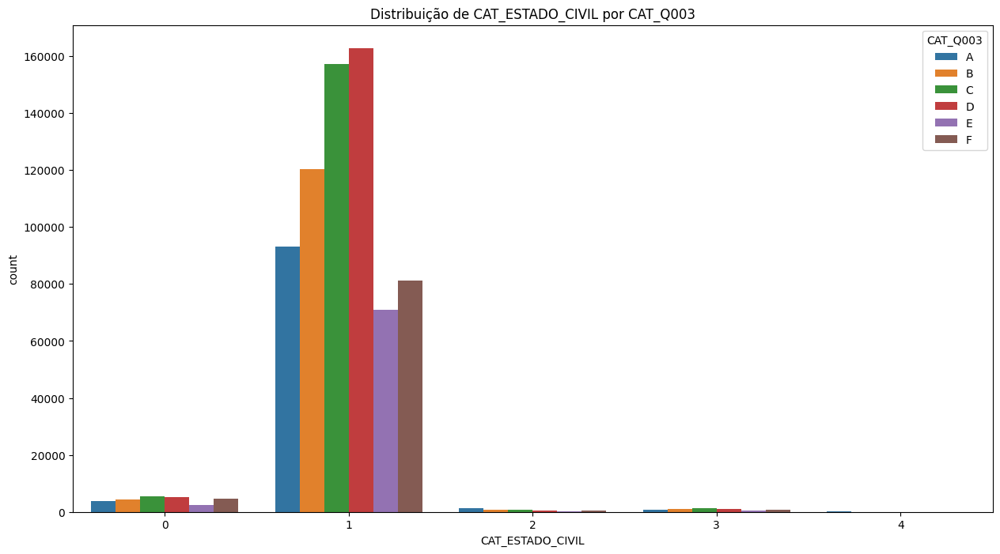

CAT_Q004              A       B      C       D      E      F
CAT_ESTADO_CIVIL                                            
0                  3021    9265   1780    6433   1795   3751
1                 73092  249607  44707  201220  53592  63269
2                  1136    1456    247     678    219    435
3                   487    2044    385    1290    364    580
4                    50      66     11      27     13     28


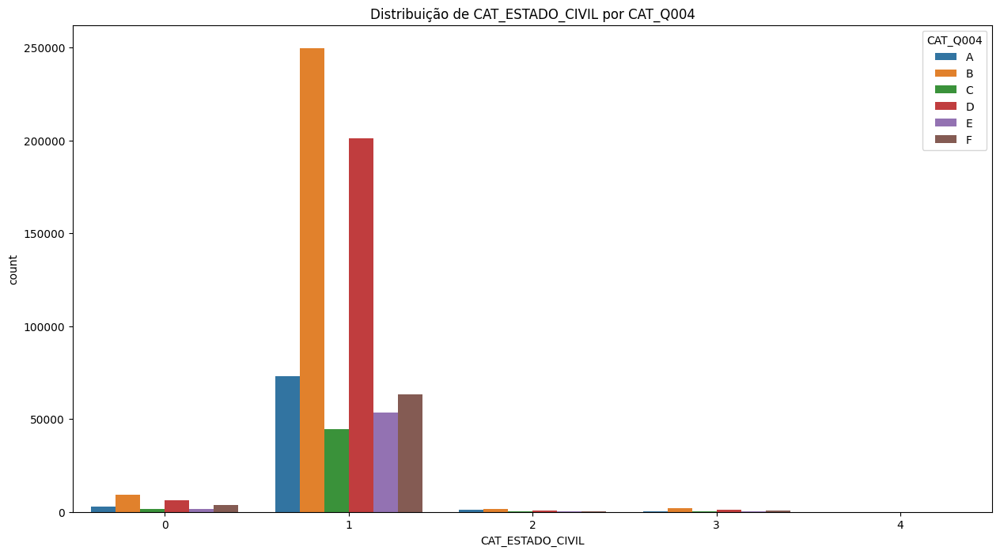

CAT_SEXO               F       M
CAT_ESTADO_CIVIL                
0                  13209   12836
1                 382092  303395
2                   2218    1953
3                   2061    3089
4                    115      80


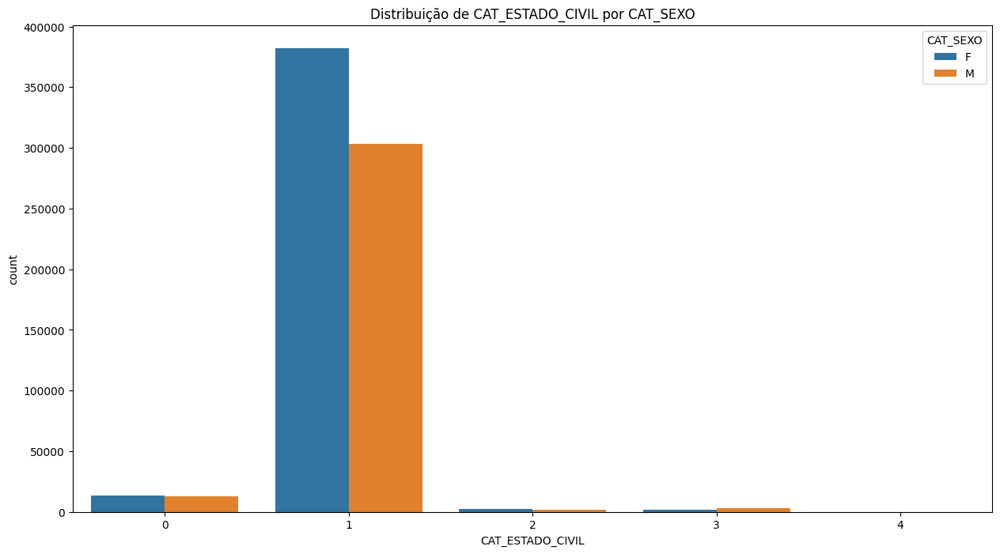

CAT_LINGUA             0       1
CAT_FAIXA_ETARIA                
1                   4091    1499
2                 191550   95027
3                 222874  136380
4                  25543   22276
5                   5171    5443
6                   1375    1738
7                    504     777
8                    330     457
9                    203     311
10                   141     252
11                   501     944
12                   305     655
13                   289     617
14                   213     390
15                   176     308
16                   130     239
17                    66     129
18                    29      57
19                    14      29
20                     4      11


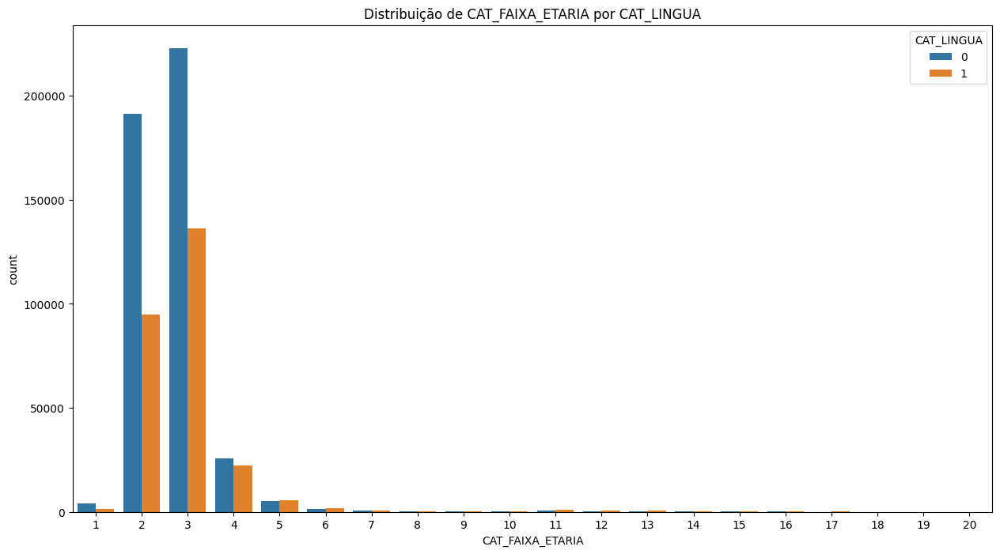

CAT_Q003              A      B      C      D      E      F
CAT_FAIXA_ETARIA                                          
1                   619    712    796   1639   1378    446
2                 32246  46043  62174  78389  37292  30433
3                 51366  65057  86198  79572  32679  44382
4                  8261   9903  11229   7844   2481   8101
5                  2345   2279   2273   1380    381   1956
6                   892    697    611    303     49    561
7                   421    259    247     77     15    262
8                   271    172    143     53      8    140
9                   165    108    113     26      3     99
10                  137     86     74     22      2     72
11                  587    286    236     68      9    259
12                  411    191    166     29      3    160
13                  427    165    126     26      6    156
14                  271    122     93     20      6     91
15                  206     90     79     19      6     

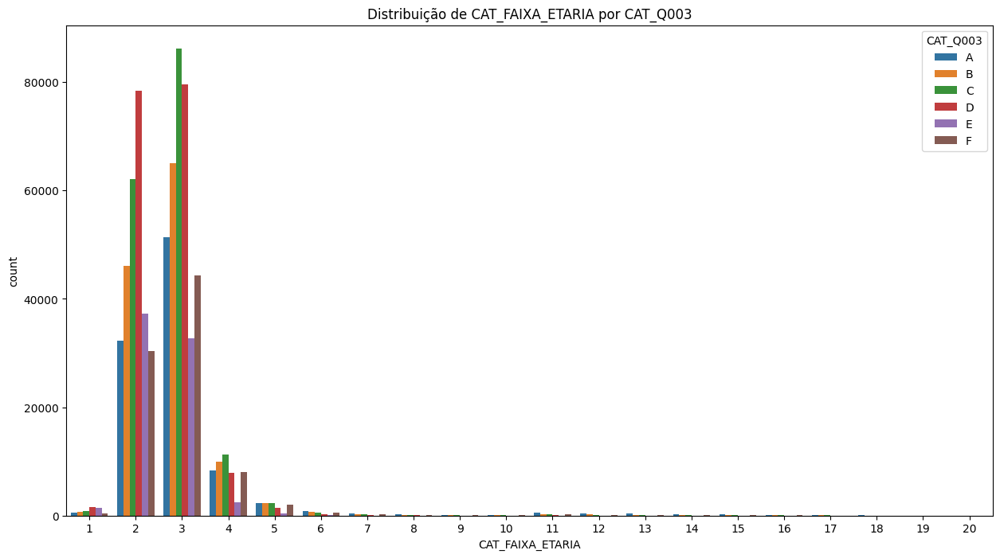

CAT_Q004              A       B      C      D      E      F
CAT_FAIXA_ETARIA                                           
1                   431    1276    227   2189   1101    366
2                 23915   94435  17766  96943  28397  25121
3                 40584  136791  24570  98411  24400  34498
4                  6983   20569   3330   9631   1763   5543
5                  2079    4661    681   1686    231   1276
6                   840    1312    187    353     42    379
7                   400     546     53    107     16    159
8                   253     348     39     63      7     77
9                   162     218     25     39      4     66
10                  128     174     23     20      8     40
11                  542     623     69     74      5    132
12                  384     398     38     37      1    102
13                  381     364     38     27      3     93
14                  257     229     31     20      1     65
15                  183     193     19  

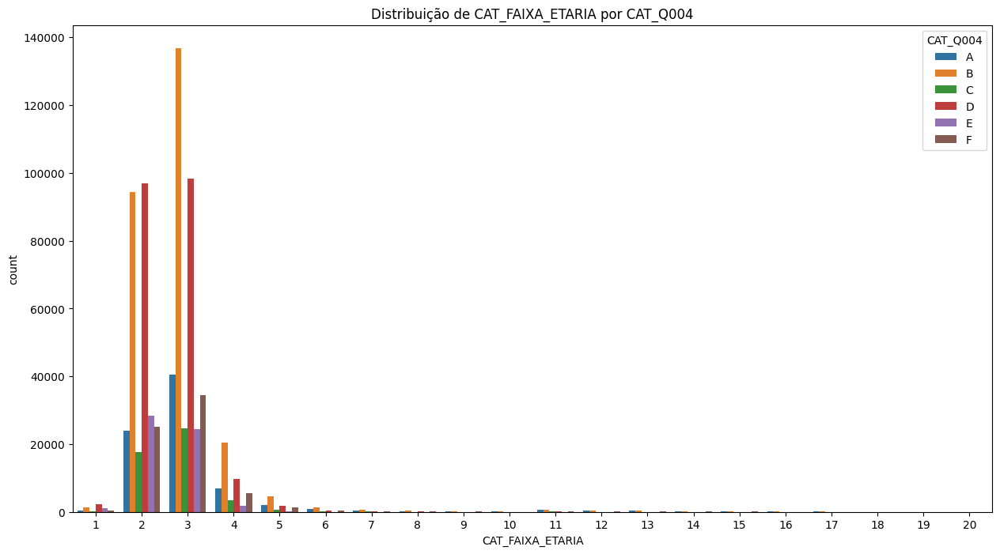

CAT_SEXO               F       M
CAT_FAIXA_ETARIA                
1                   3520    2070
2                 162813  123764
3                 198805  160449
4                  23089   24730
5                   4778    5836
6                   1424    1689
7                    634     647
8                    436     351
9                    284     230
10                   252     141
11                   985     460
12                   704     256
13                   683     223
14                   454     149
15                   341     143
16                   269     100
17                   135      60
18                    57      29
19                    24      19
20                     8       7


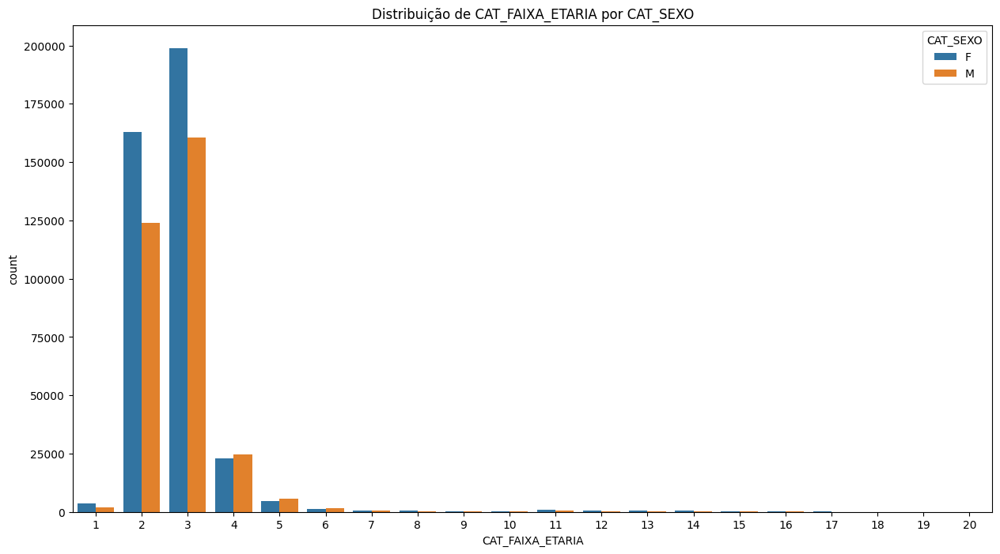

CAT_Q003        A      B       C       D      E      F
CAT_LINGUA                                            
0           39026  72488  101974  126409  64122  49490
1           59910  53818   62719   43099  10200  37793


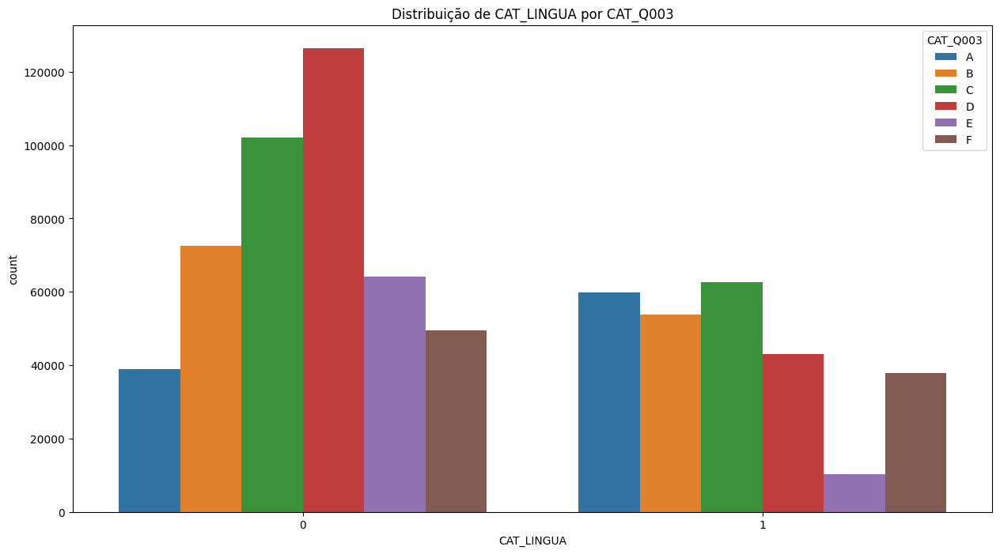

CAT_Q004        A       B      C       D      E      F
CAT_LINGUA                                            
0           28610  154325  29147  152695  48242  40490
1           49176  108113  17983   56953   7741  27573


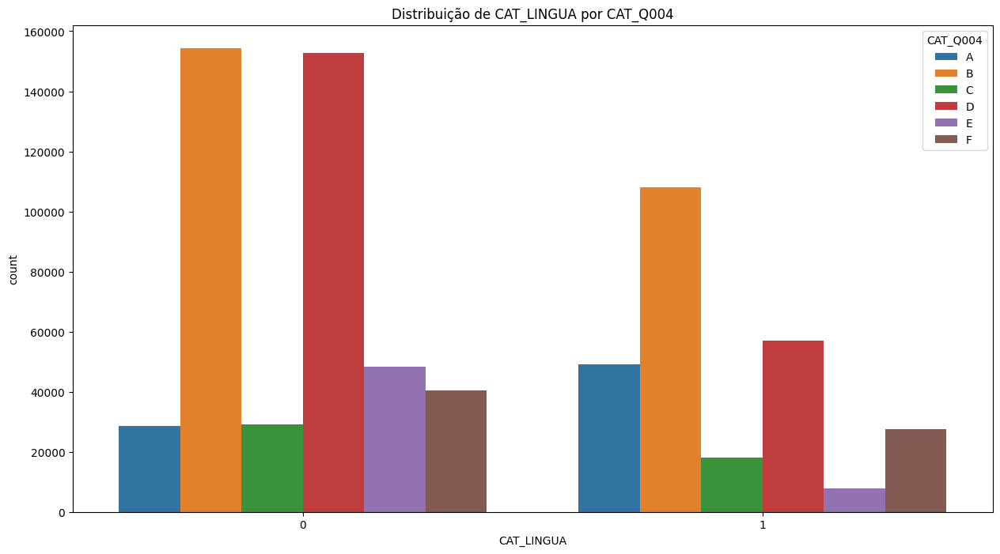

CAT_SEXO         F       M
CAT_LINGUA                
0           235606  217903
1           164089  103450


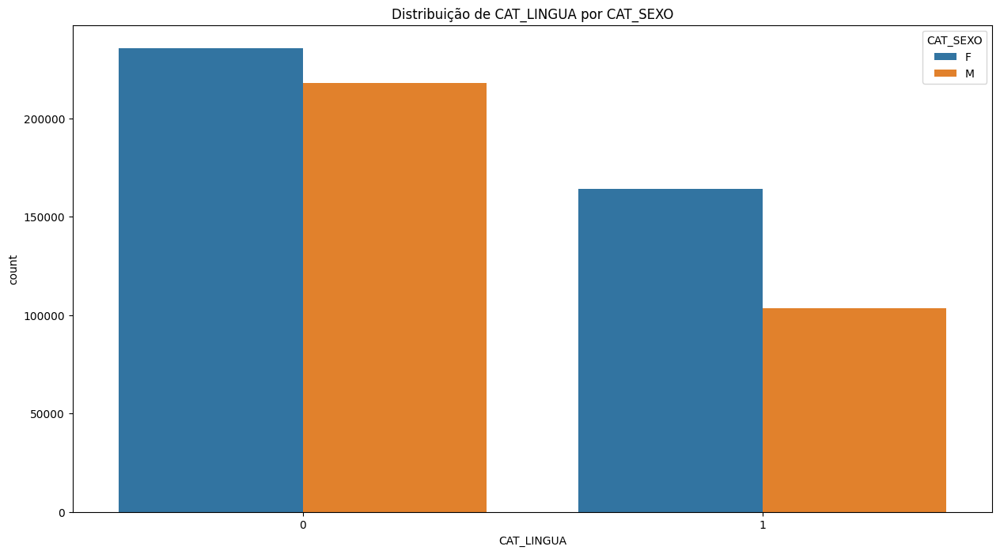

CAT_Q004      A      B      C      D      E      F
CAT_Q003                                          
A         59971  21992   2449   9759    970   3795
B          5491  81452   7494  21838   2432   7599
C          5495  79629  23775  38785   3677  13332
D          2377  39006   6753  97079  13117  11176
E           453   8109   1586  26342  32757   5075
F          3999  32250   5073  15845   3030  27086


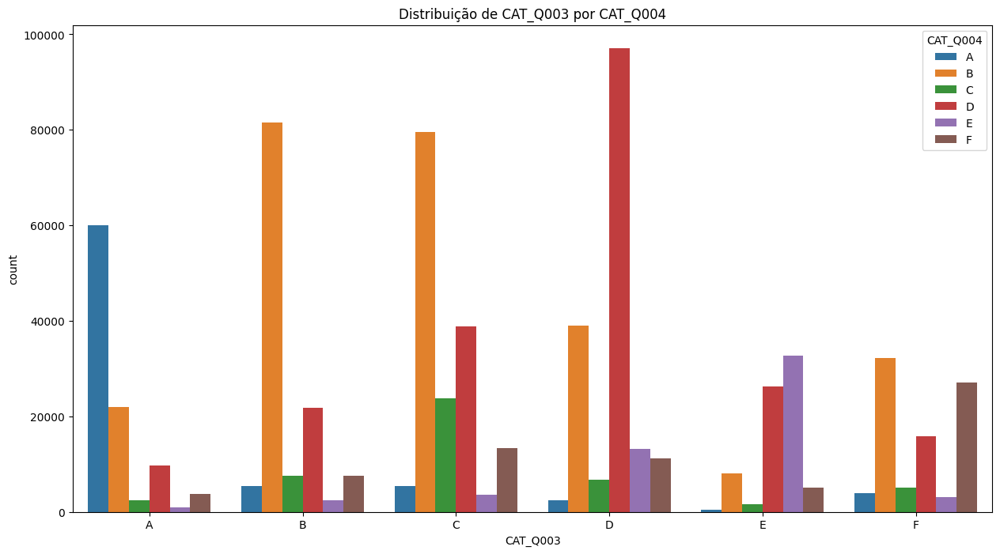

CAT_SEXO      F      M
CAT_Q003              
A         58226  40710
B         71695  54611
C         92685  72008
D         91362  78146
E         36906  37416
F         48821  38462


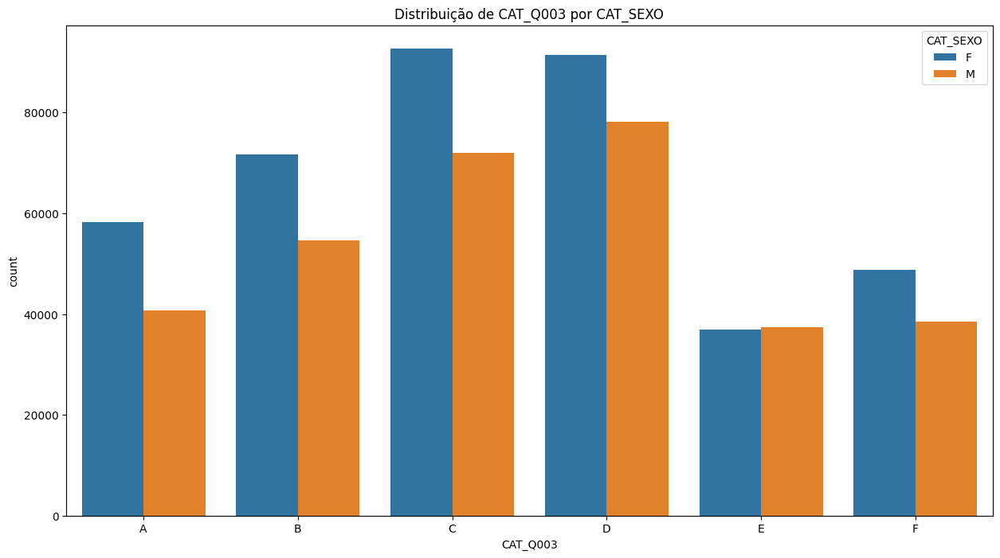

CAT_SEXO       F       M
CAT_Q004                
A          45841   31945
B         152408  110030
C          26026   21104
D         113734   95914
E          27968   28015
F          33718   34345


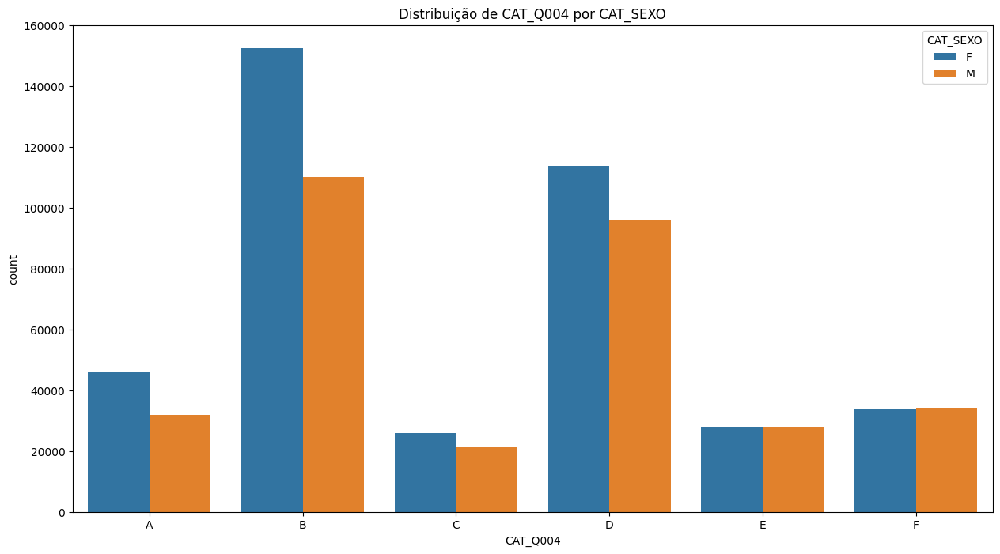

In [19]:
# crosstab para variáveis categóricas

lista_analise = ['CAT_COR_RACA', 'CAT_CO_UF_ESC', 'CAT_ESTADO_CIVIL', 'CAT_FAIXA_ETARIA', 'CAT_LINGUA','CAT_Q003', 'CAT_Q004', 'CAT_SEXO']

combinacao_analisada = []

for col in df_enem_cat[lista_analise]:
    for col2 in df_enem_cat[lista_analise]:
        if col != col2 and (col, col2) not in combinacao_analisada and (col2, col) not in combinacao_analisada:
            combinacao_analisada.append((col, col2))
            
            plt.figure(figsize=(15, 8))
            print(pd.crosstab(df_enem[col], df_enem[col2]))
            sns.countplot(data=df_enem, x=col, hue=col2)
            plt.title(f'Distribuição de {col} por {col2}')
            plt.show()

In [21]:
# analise quantidade de categorias unicas por coluna
for col in df_enem_cat.columns.to_list():
    print(f'{col}: {df_enem[col].nunique()} categorias')
    print(df_enem[col].value_counts().head(10))
    print('\n')

CAT_COR_RACA: 6 categorias
CAT_COR_RACA
1    348796
3    281529
2     68860
4     10450
0      8077
5      3336
Name: count, dtype: int64


CAT_CO_MUNICIPIO_ESC: 5480 categorias
CAT_CO_MUNICIPIO_ESC
3550308    35397
3304557    20651
2304400    20030
5300108    16817
1302603     9479
4106902     9200
3106200     8805
2611606     8332
2927408     8181
5208707     8034
Name: count, dtype: int64


CAT_CO_UF_ESC: 27 categorias
CAT_CO_UF_ESC
35    141284
23     74252
31     52823
33     49392
41     39925
29     34936
26     34632
43     32066
52     28277
15     27949
Name: count, dtype: int64


CAT_DEPENDENCIA_ADM_ESC: 4 categorias
CAT_DEPENDENCIA_ADM_ESC
2    456607
4    214671
1     43940
3      5830
Name: count, dtype: int64


CAT_ENSINO: 3 categorias
CAT_ENSINO
1    705880
0     12805
2      2363
Name: count, dtype: int64


CAT_ESCOLA: 2 categorias
CAT_ESCOLA
2    526875
3    194173
1         0
Name: count, dtype: int64


CAT_ESTADO_CIVIL: 5 categorias
CAT_ESTADO_CIVIL
1    685487
0   